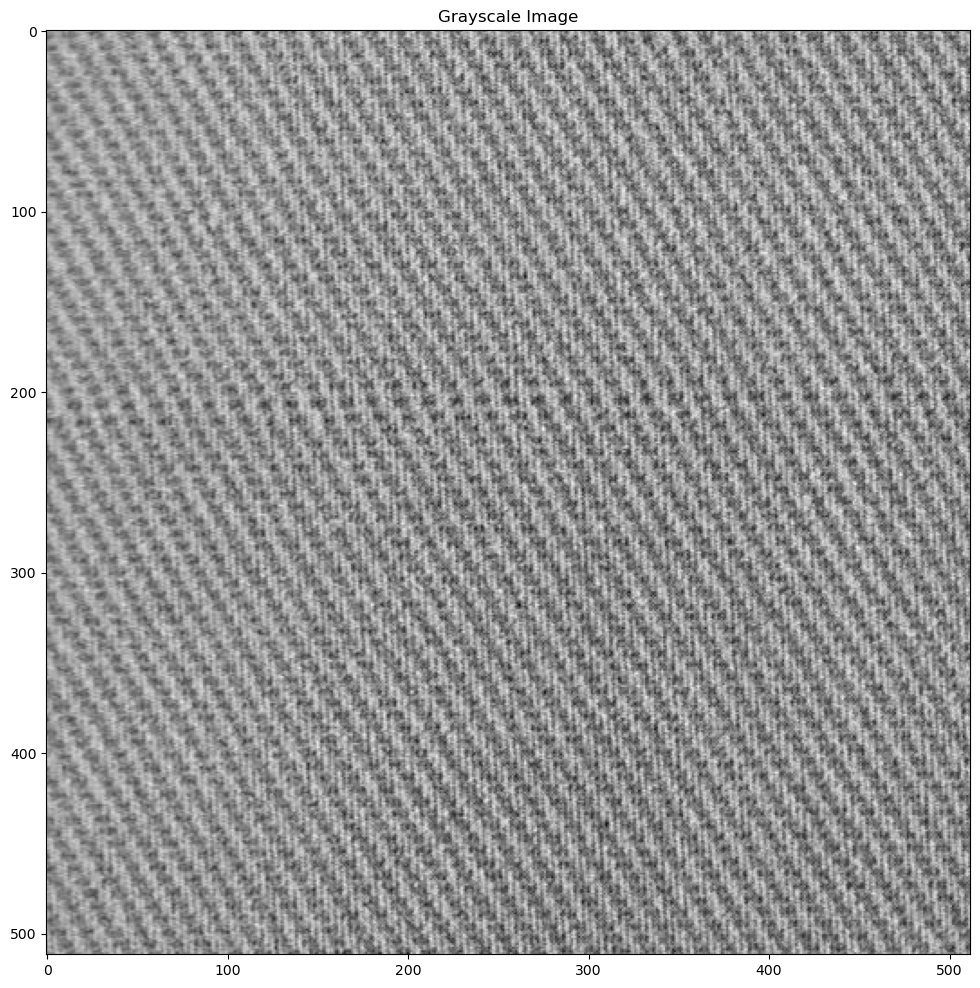

array([[0.61597412, 0.6409251 , 0.66053294, ..., 0.62356431, 0.59275725,
        0.58408078],
       [0.56919804, 0.58602314, 0.59778784, ..., 0.65493686, 0.59219176,
        0.56447294],
       [0.55072902, 0.55857216, 0.56641529, ..., 0.65437137, 0.74121137,
        0.71573255],
       ...,
       [0.62078157, 0.71211647, 0.69250863, ..., 0.54797608, 0.46226706,
        0.46535529],
       [0.56419804, 0.63870784, 0.67906235, ..., 0.63032902, 0.51241412,
        0.57123765],
       [0.54851176, 0.56419804, 0.58886627, ..., 0.73426196, 0.59476706,
        0.57629804]])

In [245]:
from skimage import color, io
import matplotlib.pyplot as plt
import numpy as np

img = color.rgb2gray(io.imread('0055.jpg'))

plt.figure(figsize=(18, 12))
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')
plt.show()
img

In [246]:
# Save the grayscale image to a file (e.g., 'grayscale_image.jpg')
#io.imsave('grayscale_image.jpg', img)

# 1. Fitting a Distribution to Pixel Values with Histogram

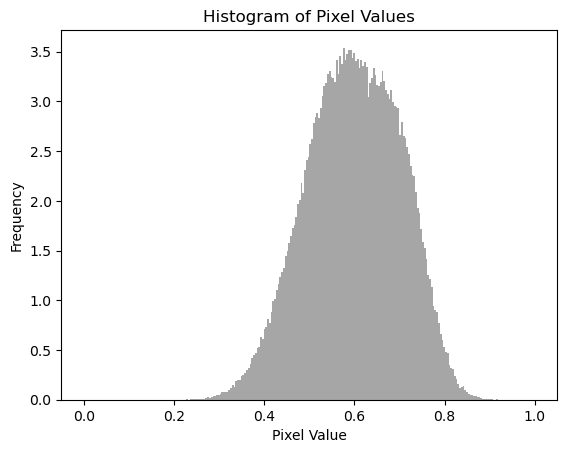

In [247]:
# Get the pixel values as a NumPy array
pixel_values = np.array(img)    # 512 lists, representing row numbers. Each of them consists of 512 numbers which are column numbers

# Plot the histogram
plt.hist(pixel_values.ravel(), bins=256, range=[0, 1], density=True, color='gray', alpha=0.7)
plt.title('Histogram of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

In [248]:
print(len(pixel_values.ravel()))
pixel_values

262144


array([[0.61597412, 0.6409251 , 0.66053294, ..., 0.62356431, 0.59275725,
        0.58408078],
       [0.56919804, 0.58602314, 0.59778784, ..., 0.65493686, 0.59219176,
        0.56447294],
       [0.55072902, 0.55857216, 0.56641529, ..., 0.65437137, 0.74121137,
        0.71573255],
       ...,
       [0.62078157, 0.71211647, 0.69250863, ..., 0.54797608, 0.46226706,
        0.46535529],
       [0.56419804, 0.63870784, 0.67906235, ..., 0.63032902, 0.51241412,
        0.57123765],
       [0.54851176, 0.56419804, 0.58886627, ..., 0.73426196, 0.59476706,
        0.57629804]])

The ravel() function is used to flatten the 2D array into a 1D array. This means that all the pixel values from each row are concatenated into a single array. So, in this context, the histogram is created from a total of 512 * 512 pixel values, representing every pixel in the image.

! Assumption: we assumed the rows and columns follow the same distribution with same parameters. This way, we were able to flatten our 2D matrix to 1D array, and plot the histogram

# 2. Calculating the Parameters of the Distribution

In [249]:
mean = pixel_values.ravel().mean()
std = pixel_values.ravel().std()

print("Mean of pixel values: ", mean)
print("Std of pixel values: ", std)

Mean of pixel values:  0.5987432987482408
Std of pixel values:  0.10332395065460287


# 3. Finding Pixels Out of 0.001 Probability Limits

In [250]:
from scipy.stats import norm

# Find the z-score corresponding to a cumulative probability of 0.001
lower_z_score = norm.ppf(0.001)
upper_z_score = norm.ppf(1-0.001)

lower_limit = lower_z_score*std + mean
upper_limit = upper_z_score*std + mean

print("Lower control limit is: ", lower_limit)
print("Upper control limit is: ", upper_limit)

Lower control limit is:  0.2794482884344981
Upper control limit is:  0.9180383090619836


In [251]:
# Identify pixel values outside the control limits. np.logical_or function checks the pixel values array, 
# if a pixel is outside the limits, returns True at its location in the out_of_control_limits array. 

out_of_control_limits = np.logical_or(pixel_values.ravel() < lower_limit, pixel_values.ravel() > upper_limit)
# Print out-of-control pixel values
print("Pixel values outside control limits:")
print(pixel_values.ravel()[out_of_control_limits])
print("Number of outliers is: ", len(pixel_values.ravel()[out_of_control_limits]))

Pixel values outside control limits:
[0.26358275 0.23532902 0.27849686 0.27115882 0.2751102  0.26023451
 0.25937922 0.25778    0.27514078 0.23898275 0.20395647 0.25718392
 0.27792353 0.27593647 0.27005765 0.2504498  0.27538588 0.27176196
 0.27062314 0.92901765 0.27592078 0.26867373 0.93651686 0.27651686
 0.26164118 0.26810824 0.25385843 0.21877176 0.27854157 0.27397922
 0.27340588 0.27903176 0.24291922 0.27681451 0.24454824 0.26861333
 0.2526898  0.21742549 0.22832706 0.24562667 0.26894863 0.27819843
 0.27789294 0.92022745 0.26918667 0.23948078 0.27259529 0.27176196
 0.24260667 0.27790078 0.27789294 0.27601176 0.27151686 0.93229765
 0.93566863 0.25101529 0.27397922 0.24817922 0.2602651  0.27454471
 0.27115882 0.26251216 0.27506549 0.24290431 0.26556275 0.27595137
 0.25466902 0.23646784 0.25493686 0.25664118 0.2465651  0.27092078
 0.27115882 0.26223725 0.23204118 0.26944667 0.15994824 0.27427686
 0.26670157 0.25846196 0.24370784 0.25969961 0.27790078 0.26083059
 0.25885843 0.27595137 0.

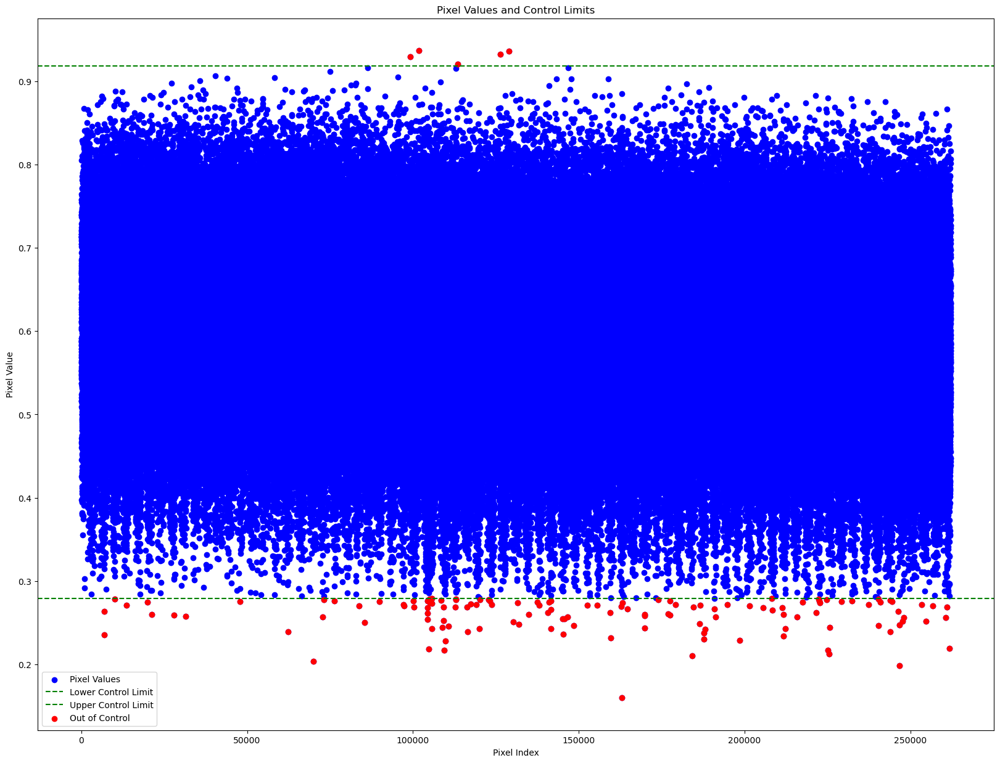

In [252]:
# Create a scatter plot of all pixel values
plt.figure(figsize=(20, 15))
plt.scatter(np.arange(pixel_values.size), pixel_values.ravel(), c='blue', label='Pixel Values')

# Plot control limit lines
plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')

# Highlight out-of-control points in red
out_of_control_indices = np.where(out_of_control_limits)
plt.scatter(out_of_control_indices, pixel_values.ravel()[out_of_control_limits], c='red', label='Out of Control')

# Add labels and legend
plt.title('Pixel Values and Control Limits')
plt.xlabel('Pixel Index')
plt.ylabel('Pixel Value')
plt.legend()

# Show the plot
plt.show()


In [253]:
print(out_of_control_indices)
print("The number of defects found: ", len(out_of_control_indices[0]))

(array([  6918,   6946,  10090,  13678,  19959,  21199,  27986,  31418,
        47872,  62299,  69897,  72687,  73094,  76215,  83736,  85350,
        89932,  97093,  97263,  99104, 100095, 100215, 101806, 104358,
       104391, 104420, 104434, 104720, 104945, 105220, 105606, 105698,
       105774, 108489, 108866, 109301, 109321, 109453, 109802, 110747,
       112830, 112905, 112954, 113427, 116212, 116497, 117399, 119084,
       120021, 120115, 122873, 123112, 123761, 126425, 128960, 130345,
       131497, 131919, 134873, 137461, 138132, 140738, 141041, 141550,
       141598, 141655, 145213, 145274, 145729, 146659, 148441, 152529,
       155557, 159414, 159555, 162721, 163078, 163105, 164755, 169791,
       169837, 169852, 173948, 176953, 177449, 177477, 179119, 184125,
       184577, 186359, 186584, 187653, 187668, 188180, 190877, 191302,
       194818, 198481, 201421, 205597, 208112, 208342, 211306, 211701,
       211716, 212273, 215880, 217571, 221626, 222373, 222559, 222665,
     

In [254]:
# Set out of control pixels to zero.

pixel_list = pixel_values.ravel()

for i in out_of_control_indices:
    pixel_list[i] = 0

print(pixel_list[out_of_control_indices])   # for check 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


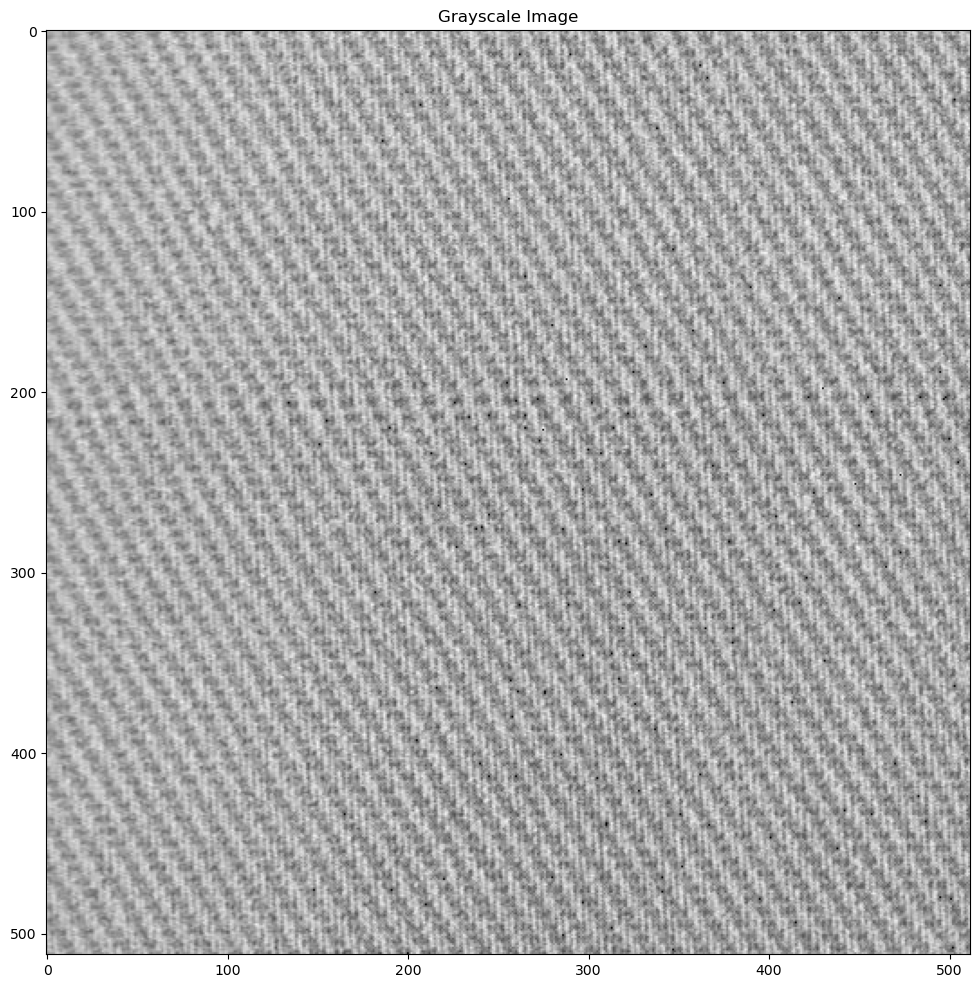

In [255]:
# Convert the list to a NumPy array and reshape it to 512x512
pixel_values_array = np.array(pixel_list).reshape((512, 512))

# Display the grayscale image with o.o.c pixels set to zero (black)
plt.figure(figsize=(18, 12))
plt.imshow(pixel_values_array, cmap='gray')
plt.title('Grayscale Image')
plt.show()


In [256]:
# Save the grayscale image to a file (e.g., 'grayscale_image.jpg')
#io.imsave('grayscale_image_3_3_applied.jpg', pixel_values_array)

In [257]:
# The following block of code is to find locations [row, column] of o.o.c pixels

# Convert the 2D NumPy array to a matrix
pixel_values_matrix = np.matrix(pixel_values_array)

# Display the matrix
print("NumPy Matrix:")
print(pixel_values_matrix)

# Find the row and column indices where entries are 0
zero_indices = np.where(pixel_values_array == 0)

# Zip row and column indices together to create [i, j] pairs
indices_pairs = list(zip(zero_indices[0], zero_indices[1]))

# Print the result
print("Row and column indices of 0 entries:")
print(indices_pairs)
print(len(indices_pairs))

NumPy Matrix:
[[0.61597412 0.6409251  0.66053294 ... 0.62356431 0.59275725 0.58408078]
 [0.56919804 0.58602314 0.59778784 ... 0.65493686 0.59219176 0.56447294]
 [0.55072902 0.55857216 0.56641529 ... 0.65437137 0.74121137 0.71573255]
 ...
 [0.62078157 0.71211647 0.69250863 ... 0.54797608 0.46226706 0.46535529]
 [0.56419804 0.63870784 0.67906235 ... 0.63032902 0.51241412 0.57123765]
 [0.54851176 0.56419804 0.58886627 ... 0.73426196 0.59476706 0.57629804]]
Row and column indices of 0 entries:
[(13, 262), (13, 290), (19, 362), (26, 366), (38, 503), (41, 207), (54, 338), (61, 186), (93, 256), (121, 347), (136, 265), (141, 495), (142, 390), (148, 439), (163, 280), (166, 358), (175, 332), (189, 325), (189, 495), (193, 288), (195, 255), (195, 375), (198, 430), (203, 422), (203, 455), (203, 484), (203, 498), (204, 272), (204, 497), (205, 260), (206, 134), (206, 226), (206, 302), (211, 457), (212, 322), (213, 245), (213, 265), (213, 397), (214, 234), (216, 155), (220, 190), (220, 265), (220, 314

# 4. Repeating 1-2-3 for 51x51 Windows of the Picture

In [258]:
img = color.rgb2gray(io.imread('0055.jpg'))
pixel_values = np.array(img)

cropped_array = pixel_values[:-2, :-2]
windows = []

for i in range(0, cropped_array.shape[0], 51):
    for j in range(0, cropped_array.shape[1], 51):
        window = cropped_array[i:i+51, j:j+51]
        windows.append(window)

window_array = np.array(windows)
print(len(window_array))
print(len(window_array[0]))
window_array[0]


100
51


array([[0.61597412, 0.6409251 , 0.66053294, ..., 0.53732039, 0.58830078,
        0.65161137],
       [0.56919804, 0.58602314, 0.59778784, ..., 0.5490851 , 0.60006549,
        0.63200353],
       [0.55072902, 0.55857216, 0.56641529, ..., 0.53339882, 0.63200353,
        0.71435647],
       ...,
       [0.54348902, 0.62192039, 0.68074392, ..., 0.70877529, 0.61829647,
        0.56339451],
       [0.59446941, 0.65329294, 0.69250863, ..., 0.6577949 , 0.66927686,
        0.69280627],
       [0.61407725, 0.65721451, 0.67290078, ..., 0.68888471, 0.73202196,
        0.7516298 ]])

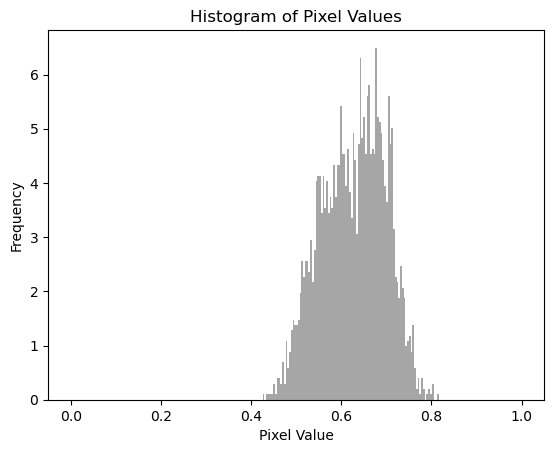

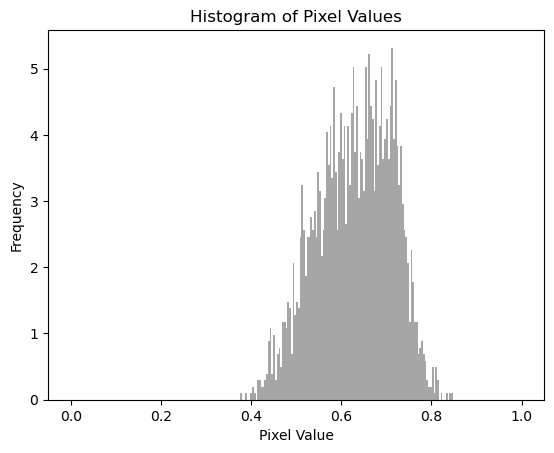

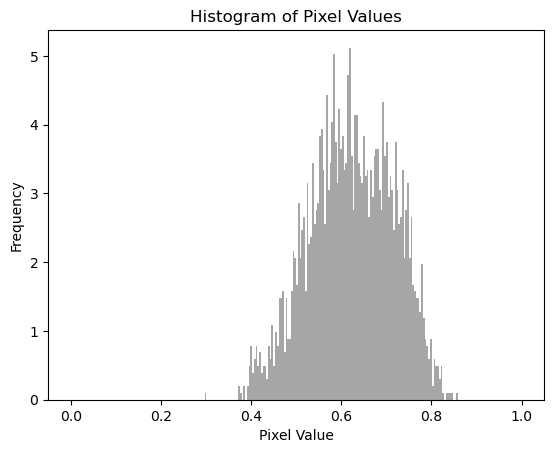

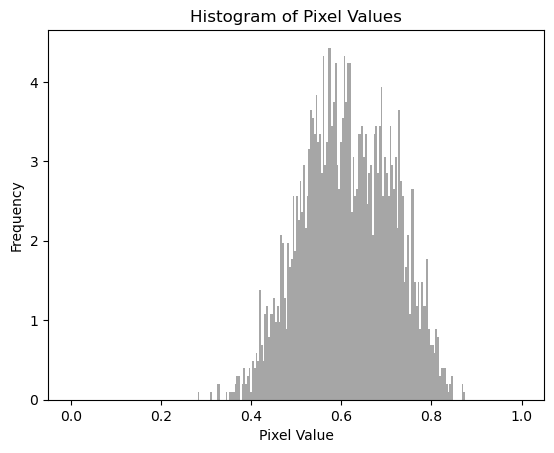

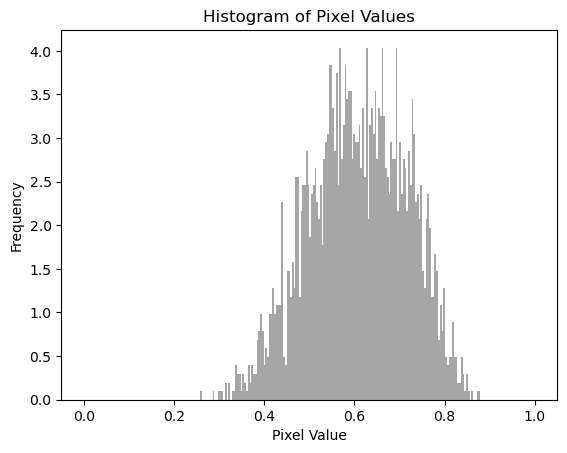

In [259]:
# We check the first 5 rows if they hold normality assumption
for i in range(5):
    
    plt.hist(window_array[i].ravel(), bins=256, range=[0, 1], density=True, color='gray', alpha=0.7)
    plt.title('Histogram of Pixel Values')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

Since they look like to have normal distribution, we continue as in 2.

For each 51x51 window, find the mean and std, find outliers, equate them to 0

In [260]:
number_of_defective = 0

# For each 1 of 100 windows, we calculate the mean and std of that window and find o.o.c points outside 0.001 probability limits

for i in range(len(window_array)):
    mean = window_array[i].ravel().mean()
    std = window_array[i].ravel().std()

    lower_z_score = norm.ppf(0.001)
    upper_z_score = norm.ppf(1-0.001)
    
    lower_limit = lower_z_score*std + mean
    upper_limit = upper_z_score*std + mean

    out_of_control_limits = np.logical_or(window_array[i].ravel() < lower_limit, window_array[i].ravel() > upper_limit)

    out_of_control_indices = np.where(out_of_control_limits)

    number_of_defective += len(out_of_control_indices[0])

    for j in out_of_control_indices:
        window_array[i].ravel()[j] = 0

print("The number of defects found: ", number_of_defective)



The number of defects found:  53


Below we reconstruct the image from 100 many 51x51 windows

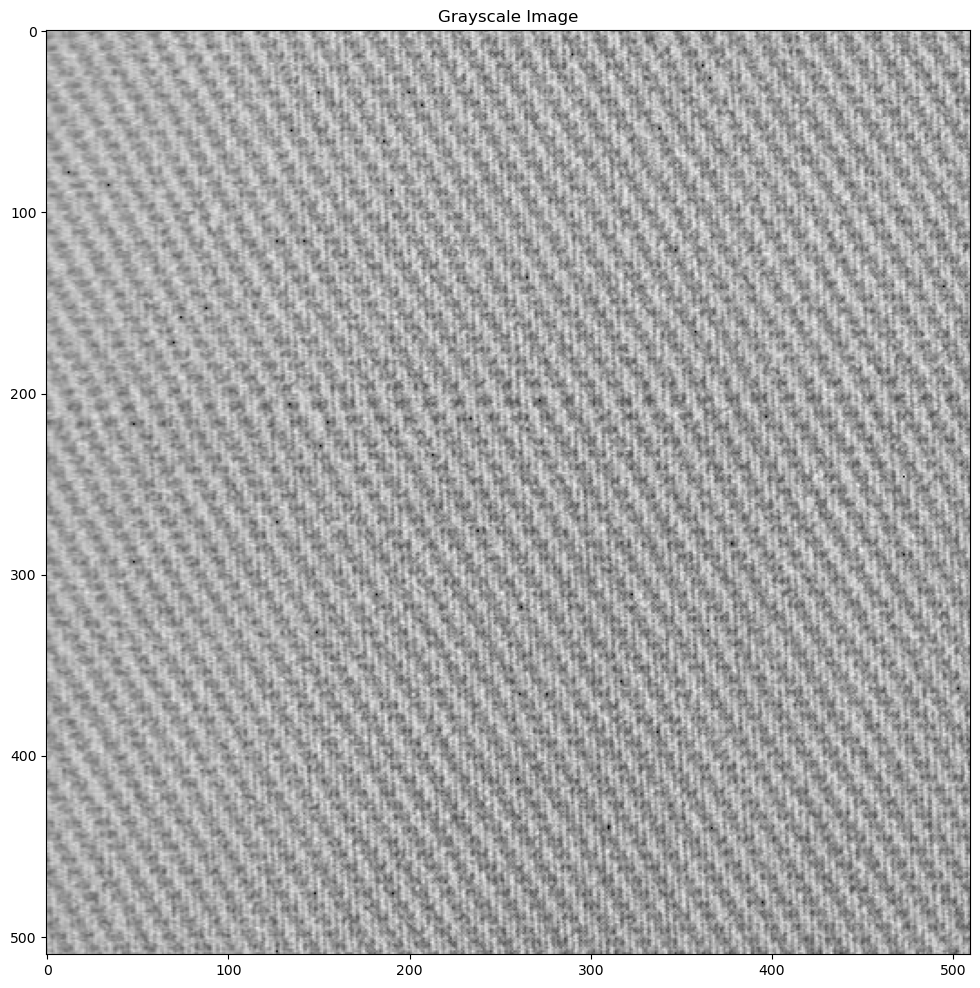

53
Out of Control Locations:
[(13, 290), (19, 362), (26, 366), (34, 150), (34, 200), (41, 207), (54, 338), (55, 135), (61, 186), (78, 12), (85, 34), (88, 190), (116, 127), (116, 142), (121, 347), (136, 265), (141, 495), (153, 88), (158, 74), (166, 358), (172, 70), (204, 272), (206, 134), (213, 397), (214, 234), (216, 155), (217, 48), (229, 151), (234, 213), (246, 473), (271, 127), (276, 238), (283, 378), (289, 473), (293, 48), (311, 182), (311, 323), (318, 262), (331, 365), (332, 149), (359, 317), (363, 503), (366, 261), (366, 276), (387, 337), (413, 260), (439, 310), (440, 310), (440, 367), (476, 148), (476, 191), (481, 395), (508, 127)]


In [261]:
window_counter = 0
reconstructed_values = np.zeros((510,510))

for i in range(0, 510, 51):
    for j in range(0, 510, 51):
        window = window_array[window_counter]
        reconstructed_values[i:i+51, j:j+51] = window
        window_counter += 1

# Display the grayscale image with the 'gray' colormap
plt.figure(figsize=(18, 12))
plt.imshow(reconstructed_values, cmap='gray')
plt.title('Grayscale Image')
plt.show()

# Convert the 2D NumPy array to a matrix
reconstructed_matrix = np.matrix(reconstructed_values)

# Find the row and column indices where entries are 0
zero_indices_3 = np.where(reconstructed_values == 0)

# Zip row and column indices together to create [i, j] pairs
indices_pairs_3 = list(zip(zero_indices_3[0], zero_indices_3[1]))

# Print the result
print(len(indices_pairs_3))
print("Out of Control Locations:")
print(indices_pairs_3)


Now we will investigate the common o.o.c points of two approaches

In [262]:
# Convert lists to sets
set1 = set(indices_pairs)
set2 = set(indices_pairs_3)

# Find common tuples
common_tuples = set1.intersection(set2)

# Print or use the common tuples as needed
print("The number of Common Defectives of First Two Approach:", len(common_tuples))
print(common_tuples)

The number of Common Defectives of First Two Approach: 37
{(476, 148), (246, 473), (136, 265), (121, 347), (61, 186), (283, 378), (206, 134), (440, 310), (41, 207), (229, 151), (289, 473), (276, 238), (387, 337), (141, 495), (318, 262), (19, 362), (54, 338), (311, 323), (440, 367), (481, 395), (214, 234), (331, 365), (311, 182), (439, 310), (234, 213), (216, 155), (13, 290), (359, 317), (366, 261), (413, 260), (26, 366), (366, 276), (213, 397), (363, 503), (476, 191), (204, 272), (166, 358)}


In [263]:
# Save the grayscale image to a file (e.g., 'grayscale_image.jpg')
#io.imsave('reconstructed_from_51x51_windows.jpg', reconstructed_values)

# 5. Defect Detection with 3-Sigma Control Charts for Rows

First we take each row as a sample with sample size 512. Then construct X-bar chart and S chart for each row ie. sample.

The number of out of control points:  116
Indices of out-of-control points: [  2  10  19  22  26  30  35  36  37  39  42  43  54  55  56  70  82 121
 125 126 141 152 161 170 177 178 180 194 195 196 202 203 204 205 206 207
 211 212 213 214 234 237 241 244 245 248 249 252 256 260 261 262 263 267
 269 276 280 283 284 287 304 307 311 315 318 322 335 336 342 346 351 355
 359 362 366 369 372 373 375 376 379 380 382 386 387 389 390 393 394 396
 397 401 403 404 406 407 410 414 417 419 421 423 424 430 431 434 444 446
 450 451 454 458 461 471 479 500]


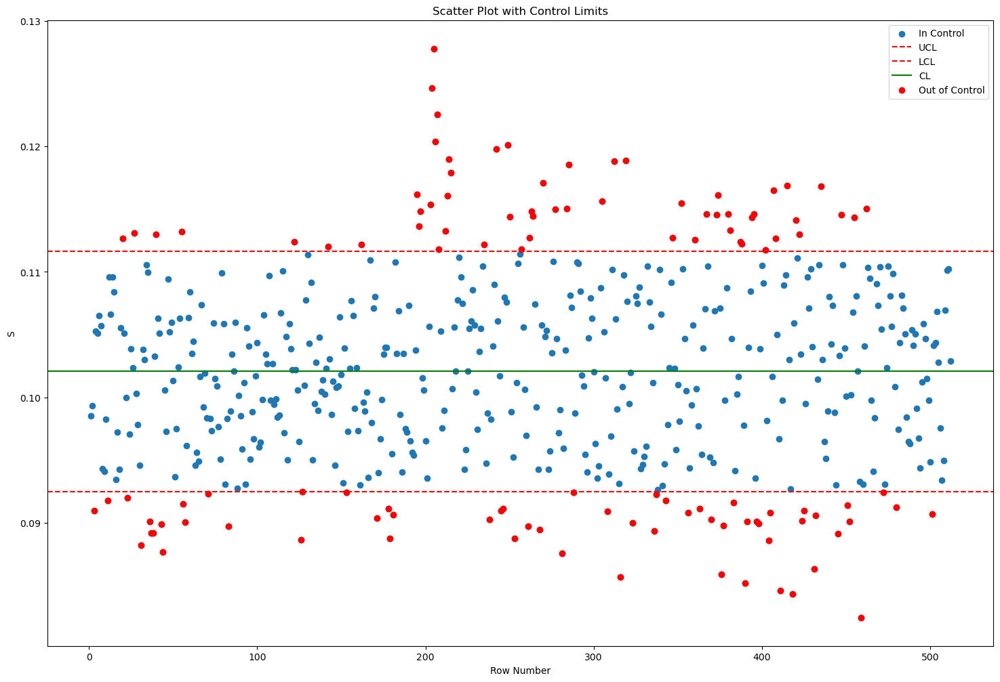

In [264]:
img = color.rgb2gray(io.imread('0055.jpg'))
pixel_values = np.array(img)
n = 512

c4 = 4* (n-1) / (4*n - 3)
A3 = 3 / (c4 * n**0.5)
B3 = 1 - (3/(c4 * (2*(n-1))**0.5))
B4 = 1 + (3/(c4 * (2*(n-1))**0.5))

# S CHART

std_list = []

for i in range(pixel_values.shape[0]):
    std = pixel_values[i].std()
    std_list.append(std)

S_bar = np.array(std_list).mean()

UCL_S = B4 * S_bar
CL_S = S_bar
LCL_S = B3 * S_bar

out_of_control_indices_S = np.where((np.array(std_list) > UCL_S) | (np.array(std_list) < LCL_S))[0]

# Scatter plot
plt.figure(figsize=(18, 12))
plt.scatter(range(1, len(std_list) + 1), std_list, label='In Control')

# Control limits lines
plt.axhline(y=UCL_S, color='r', linestyle='--', label='UCL')
plt.axhline(y=LCL_S, color='r', linestyle='--', label='LCL')
plt.axhline(y=CL_S, color='g', linestyle='-', label='CL')

plt.scatter([i + 1 for i in out_of_control_indices_S], [std_list[i] for i in out_of_control_indices_S], color='red', label='Out of Control')

# Labels and title
plt.xlabel('Row Number')
plt.ylabel('S')
plt.title('Scatter Plot with Control Limits')
plt.legend()


# Print or use the indices as needed
print("The number of out of control points: ", len(out_of_control_indices_S))
print("Indices of out-of-control points:", out_of_control_indices_S)

In [265]:
pixel_values_incontrol = np.delete(pixel_values, out_of_control_indices_S, axis=0)
print(pixel_values_incontrol.shape[0])
print(len(pixel_values_incontrol[0]))

396
512


The number of out of control points:  155
Indices of out-of-control points: [  1  13  14  15  16  19  21  23  24  31  34  37  38  39  41  42  46  47
  48  49  50  51  52  53  54  55  56  58  59  60  61  64  65  68  71  72
  73  75  76  78  79  82  83  85  88  89  91  92  94  95  96 103 105 106
 107 112 113 114 116 117 123 126 129 130 132 141 142 153 158 168 169 170
 173 174 175 178 185 186 198 199 211 221 226 231 232 238 244 249 251 254
 259 260 266 267 271 291 292 298 305 308 309 312 316 320 323 324 326 328
 329 334 335 336 339 340 343 344 348 349 350 351 354 355 356 357 360 361
 362 363 364 366 367 368 369 370 371 373 374 375 376 380 381 382 383 384
 385 386 387 388 389 390 391 392 393 394 395]


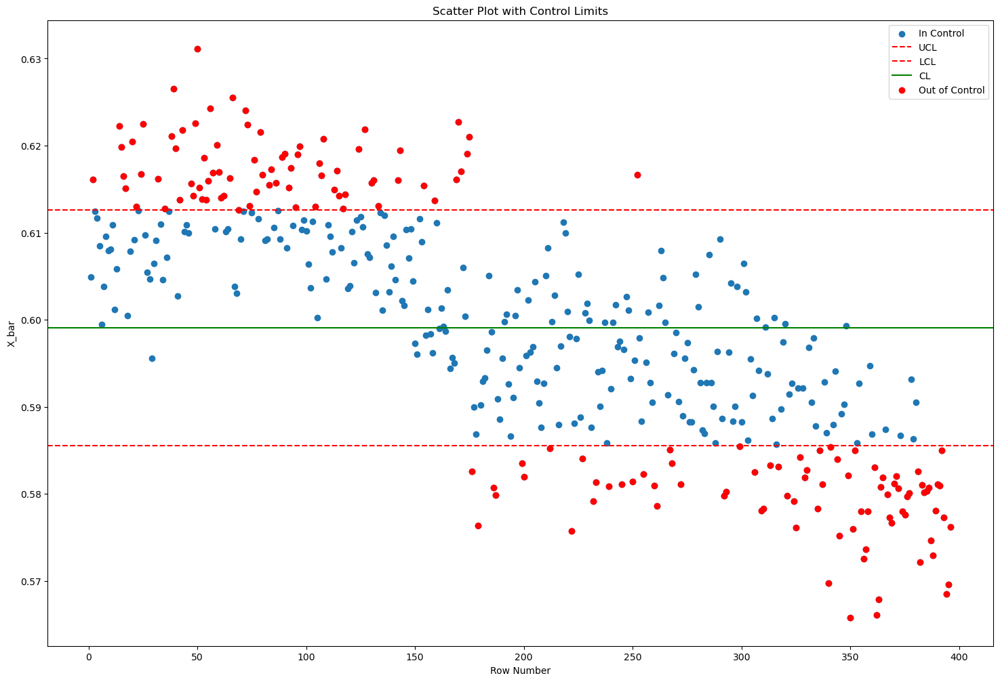

In [266]:
mean_list = []

for i in range(pixel_values_incontrol.shape[0]):
    mean = pixel_values_incontrol[i].mean()
    mean_list.append(mean)

X_bar_bar = np.array(mean_list).mean()

UCL_X_bar = X_bar_bar + A3 * S_bar
CL_X_bar = X_bar_bar
LCL_X_bar = X_bar_bar - A3 * S_bar

out_of_control_indices_X = np.where((np.array(mean_list) > UCL_X_bar) | (np.array(mean_list) < LCL_X_bar))[0]

# Scatter plot
plt.figure(figsize=(18, 12))
plt.scatter(range(1, len(mean_list) + 1), mean_list, label='In Control')

# Control limits lines
plt.axhline(y=UCL_X_bar, color='r', linestyle='--', label='UCL')
plt.axhline(y=LCL_X_bar, color='r', linestyle='--', label='LCL')
plt.axhline(y=CL_X_bar, color='g', linestyle='-', label='CL')

plt.scatter([i + 1 for i in out_of_control_indices_X], [mean_list[i] for i in out_of_control_indices_X], color='red', label='Out of Control')

# Labels and title
plt.xlabel('Row Number')
plt.ylabel('X_bar')
plt.title('Scatter Plot with Control Limits')
plt.legend()


# Print or use the indices as needed
print("The number of out of control points: ", len(out_of_control_indices_X))
print("Indices of out-of-control points:", out_of_control_indices_X)

Apparently, X-bar and S chart is not appropriate for defect detection in linen images. If we also were to discard out of control points in X-bar chart, we would lose more than the half of all pixels, which does not make sense. In addition, we clearly see a downward shift in X-bar chart, which means the image is getting darker towards the bottom. 

# 6. Defect Detection with 0.001 Probability Limit Control Charts for Rows

Below we assume each row is normally distributed. Then we find the mean and standard deviation of each row, find the points out of 0.001 probability limits, and discard (equate to 0) only those points instead of discarding the whole row. After all, we reconstruct the image and count the number of out of control points.

In [267]:
img = color.rgb2gray(io.imread('0055.jpg'))
pixel_values = np.array(img)

number_of_defectives = []
ooc_locations_by_row = []

lower_z_score = norm.ppf(0.001)
upper_z_score = norm.ppf(1-0.001)

for i in range(pixel_values.shape[0]):

    mean = pixel_values[i].mean()
    std = pixel_values[i].std()

    upper_control_limit = upper_z_score * std + mean
    lower_control_limit = lower_z_score * std + mean

    out_of_control_indices = np.where((pixel_values[i] > upper_control_limit) | (pixel_values[i] < lower_control_limit))[0]

    number_of_defectives.append(len(out_of_control_indices))

    for j in out_of_control_indices:
        pixel_values[i][j] = 0
        ooc_locations_by_row.append((i,j))


print("The number of defectives row by row: ", np.sum(np.array(number_of_defectives)))
print("Out of Control Locations:")
print(ooc_locations_by_row)


The number of defectives row by row:  90
Out of Control Locations:
[(1, 457), (1, 460), (10, 385), (10, 505), (13, 290), (28, 180), (37, 495), (38, 503), (41, 207), (41, 222), (55, 231), (61, 186), (71, 464), (80, 362), (82, 213), (82, 243), (82, 255), (88, 190), (88, 266), (91, 392), (92, 285), (93, 256), (99, 382), (100, 411), (102, 290), (105, 472), (113, 465), (121, 347), (127, 440), (133, 500), (134, 367), (136, 265), (141, 495), (142, 372), (142, 390), (144, 238), (148, 439), (153, 472), (163, 280), (166, 358), (170, 236), (175, 332), (176, 320), (193, 288), (198, 430), (216, 155), (227, 273), (229, 151), (234, 213), (251, 448), (252, 497), (257, 335), (266, 427), (274, 450), (281, 485), (286, 227), (287, 450), (289, 473), (308, 482), (318, 262), (321, 403), (331, 365), (337, 457), (349, 431), (356, 231), (359, 317), (360, 257), (363, 503), (366, 276), (376, 508), (387, 337), (388, 349), (397, 251), (404, 510), (413, 260), (424, 483), (424, 510), (432, 442), (438, 487), (439, 310

# 7. Defect Detection with 0.001 Probability Limit Control Charts for Columns

In [268]:
img = color.rgb2gray(io.imread('0055.jpg'))
pixel_values = np.array(img).T

number_of_defectives = []
ooc_locations_by_column = []

lower_z_score = norm.ppf(0.001)
upper_z_score = norm.ppf(1-0.001)

for i in range(pixel_values.shape[0]):

    mean = pixel_values[i].mean()
    std = pixel_values[i].std()

    upper_control_limit = upper_z_score * std + mean
    lower_control_limit = lower_z_score * std + mean

    out_of_control_indices = np.where((pixel_values[i] > upper_control_limit) | (pixel_values[i] < lower_control_limit))[0]

    number_of_defectives.append(len(out_of_control_indices))

    for j in out_of_control_indices:
        pixel_values[i][j] = 0
        ooc_locations_by_column.append((j,i))

    
sorted_list = sorted(ooc_locations_by_column, key=lambda x: x[0])

print("The number of defectives column by column: ", np.sum(np.array(number_of_defectives)))
print("Out of Control Locations:")
sorted_list

The number of defectives column by column:  55
Out of Control Locations:


[(41, 207),
 (61, 186),
 (78, 12),
 (116, 127),
 (136, 265),
 (153, 88),
 (158, 74),
 (198, 430),
 (202, 499),
 (203, 498),
 (204, 272),
 (206, 121),
 (206, 134),
 (207, 121),
 (208, 44),
 (213, 397),
 (214, 234),
 (216, 1),
 (216, 155),
 (217, 18),
 (217, 19),
 (217, 48),
 (217, 64),
 (224, 57),
 (227, 273),
 (229, 151),
 (243, 140),
 (257, 335),
 (263, 217),
 (271, 127),
 (276, 238),
 (283, 378),
 (286, 227),
 (289, 473),
 (311, 182),
 (318, 262),
 (321, 403),
 (333, 118),
 (364, 216),
 (366, 261),
 (366, 276),
 (367, 276),
 (373, 326),
 (382, 13),
 (387, 337),
 (440, 310),
 (463, 93),
 (476, 191),
 (481, 395),
 (481, 501),
 (492, 126),
 (499, 24),
 (499, 156),
 (508, 127),
 (511, 200)]

In [269]:
# Convert lists to sets
set1 = set(ooc_locations_by_row)
set2 = set(ooc_locations_by_column)

# Find common tuples
common_tuples_2 = set1.intersection(set2)

# Print or use the common tuples as needed
print("The number of Common Defectives From Last Two Approach:", len(common_tuples_2))
print(common_tuples_2)

The number of Common Defectives From Last Two Approach: 19
{(511, 200), (136, 265), (61, 186), (227, 273), (257, 335), (440, 310), (41, 207), (229, 151), (289, 473), (387, 337), (286, 227), (318, 262), (481, 395), (321, 403), (216, 155), (198, 430), (366, 276), (481, 501), (476, 191)}


In [270]:
common_defectives = common_tuples.intersection(common_tuples_2)
print("The number of Common Defectives From All Approaches:")
print(len(common_defectives))
print(common_defectives)

The number of Common Defectives From All Approaches:
12
{(41, 207), (136, 265), (229, 151), (216, 155), (289, 473), (61, 186), (387, 337), (318, 262), (366, 276), (481, 395), (476, 191), (440, 310)}


A general solution to find defectives may be to apply 4 approaches (1- check all pixels at once, 2- check 51x51 windows separately, 3- check row by row, 4- check column by column) at the same time and find the common out of control points by taking the intersection of the out of control points of these 4 approaches. However, depending on the pattern, this approach may miss out of control points that are actually important in one of any approaches.

Moreover, all aproaches we used above, investigate the image in 1D. On the other hand, linen may has a pattern. We should use approaches that consider 2D. 

# 8. Defect Detection with 2D Autoregressive Model

## 8.1 2D Autoregressive Model for Predicting Middle Pixel of 3x3 Windows

Below we try to predict each pixel as the weighted sum of its surrounding pixels. To do that, we took 3x3 windows that contain 9 pixels in total. Then we set the target value as the pixel value that is in the middle of the 3x3 window so that we can predict it. 

In [271]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

img = color.rgb2gray(io.imread('0055.jpg'))
image_matrix = np.matrix(img)

# Function to extract 3x3 sub-matrices and their corresponding target pixels
def extract_submatrices_and_targets_3(image_matrix):
    submatrices = []
    targets = []

    for i in range(1, image_matrix.shape[0] - 1):
        for j in range(1, image_matrix.shape[1] - 1):
            submatrix = image_matrix[i-1:i+2, j-1:j+2].flatten()
            target_pixel = image_matrix[i, j]
            submatrices.append(submatrix)
            targets.append(target_pixel)

    return np.array(submatrices), np.array(targets)

# Extract sub-matrices and targets
submatrices, targets = extract_submatrices_and_targets_3(image_matrix)

print(submatrices[0])
print(targets[0])

submatrices[1]

[[0.61597412 0.6409251  0.66053294 0.56919804 0.58602314 0.59778784
  0.55072902 0.55857216 0.56641529]]
0.586023137254902


array([[0.6409251 , 0.66053294, 0.67146431, 0.58602314, 0.59778784,
        0.61264078, 0.55857216, 0.56641529, 0.58126824]])

In [272]:
submatrices = np.delete(submatrices, np.arange(4, submatrices.shape[-1], 5), axis=-1)   # Delete the pixel which to be predicted 
submatrices[1]

array([[0.6409251 , 0.66053294, 0.67146431, 0.58602314, 0.61264078,
        0.55857216, 0.56641529, 0.58126824]])

In [273]:
# Reshape submatrices to ensure they are 2D
submatrices_flat = submatrices.reshape(submatrices.shape[0], -1)
submatrices_flat[0]

array([0.61597412, 0.6409251 , 0.66053294, 0.56919804, 0.59778784,
       0.55072902, 0.55857216, 0.56641529])

In [274]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(submatrices_flat, targets, test_size=0.2, random_state=42)

# Create and train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f"Mean Squared Error: {mse}")

# Display the coefficients of the model (weights)
weights = model.coef_
print("Model Coefficients (Weights):")
print(weights)

r_squared = r2_score(y_test, predictions)
print(f"R-squared Value: {r_squared}")

Mean Squared Error: 0.0025615020982218623
Model Coefficients (Weights):
[-0.09062977  0.37021698 -0.09980093  0.3500906   0.34838072 -0.09978587
  0.36800241 -0.09073178]
R-squared Value: 0.762668518554421


The model produces relatively good results.

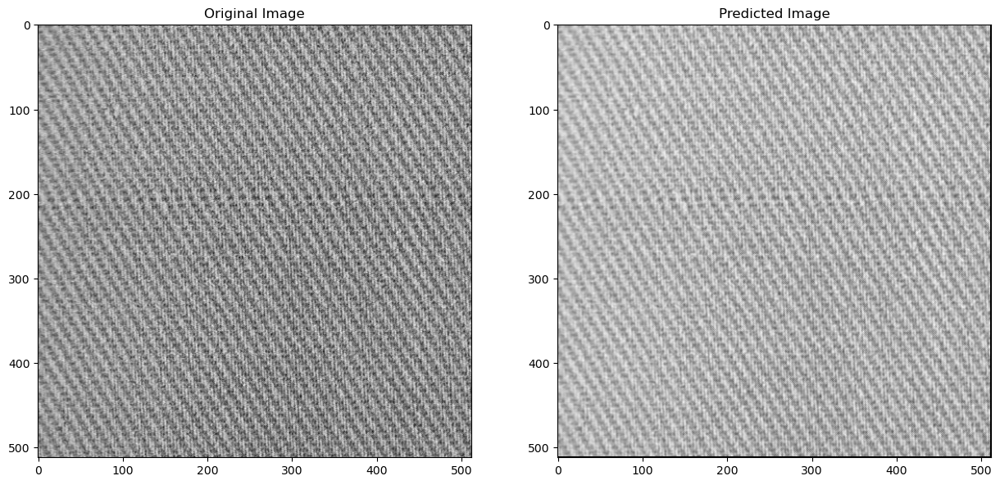

In [275]:
# Function to reconstruct the image using learned weights
def reconstruct_image(image_matrix, learned_weights):
    reconstructed_image = np.zeros_like(image_matrix)

    for i in range(1, image_matrix.shape[0] - 1):
        for j in range(1, image_matrix.shape[1] - 1):
            submatrix = image_matrix[i-1:i+2, j-1:j+2].flatten()
            updated_matrix = np.delete(np.array(submatrix), 4, axis=-1)
            predicted_pixel = np.dot(updated_matrix, learned_weights)
            reconstructed_image[i, j] = predicted_pixel

    return reconstructed_image

# Reconstruct the image using learned weights
reconstructed_img = reconstruct_image(image_matrix, weights)

# Display the original and reconstructed images side by side
plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(image_matrix, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_img, cmap='gray')
plt.title('Predicted Image')

plt.show()


In [276]:
reconstructed_img

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.62227166, 0.63799937, ..., 0.68839667, 0.6731131 ,
         0.        ],
        [0.        , 0.58295931, 0.59655967, ..., 0.69977737, 0.72523114,
         0.        ],
        ...,
        [0.        , 0.70767622, 0.69948593, ..., 0.62777543, 0.44929536,
         0.        ],
        [0.        , 0.67181961, 0.68899771, ..., 0.62452794, 0.58803192,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

The first and last rows and columns are 0 because they don't have 8 pixels surrounding them. We need to discard those rows and columns to inspect residuals correctly

In [277]:
# Calculate residuals
residuals = image_matrix - reconstructed_img

trimmed_residuals = residuals[1:-1, 1:-1]

residuals_list = np.array(trimmed_residuals.ravel())[0]

residuals_list


array([-0.03624852, -0.04021152, -0.04109965, ..., -0.14208834,
        0.00580108, -0.0756178 ])

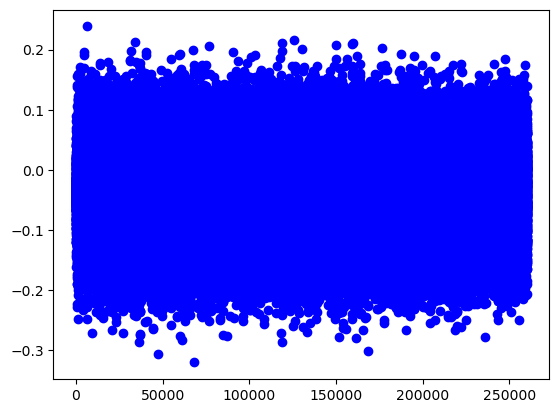

In [278]:
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Pixel Values')

Residuals can be assumed to have constant variance, we continue

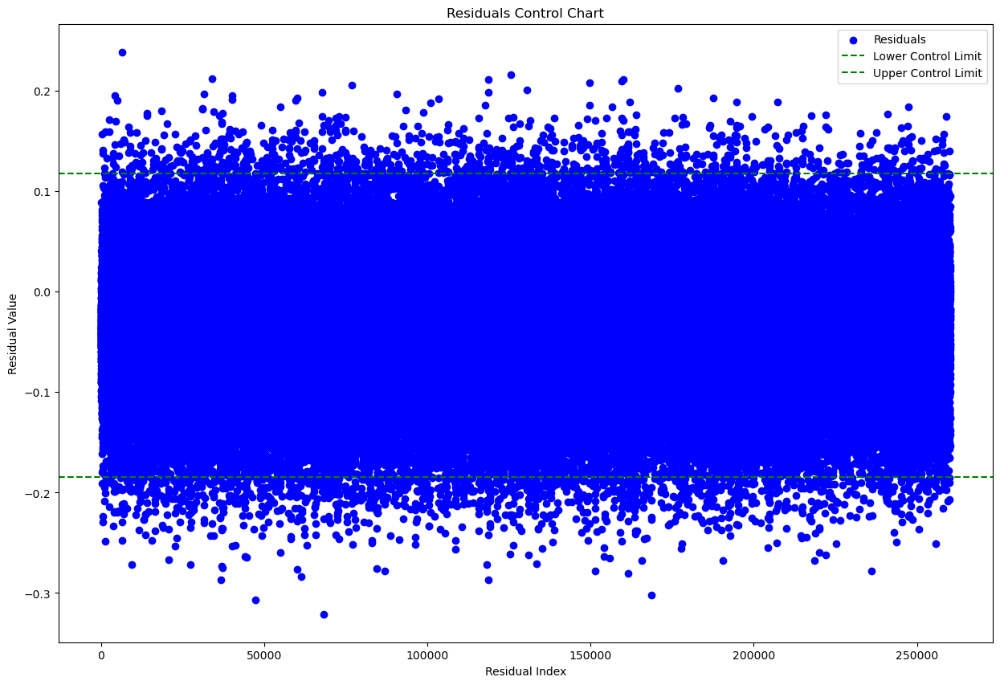

In [279]:
mean = residuals_list.mean()
std = residuals_list.std()

lower_limit = mean - 3*std
upper_limit = mean + 3*std

# Create a scatter plot of all pixel values
plt.figure(figsize=(15, 10))
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Residuals')

# Plot control limit lines
plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')

# Highlight out-of-control points in red
'''out_of_control_indices = np.where(out_of_control_limits)
plt.scatter(out_of_control_indices, pixel_values.ravel()[out_of_control_limits], c='red', label='Out of Control')'''

# Add labels and legend
plt.title('Residuals Control Chart')
plt.xlabel('Residual Index')
plt.ylabel('Residual Value')
plt.legend()

# Show the plot
plt.show()


Since there are unhandleable many outliers, we try 4-sigma limits below.

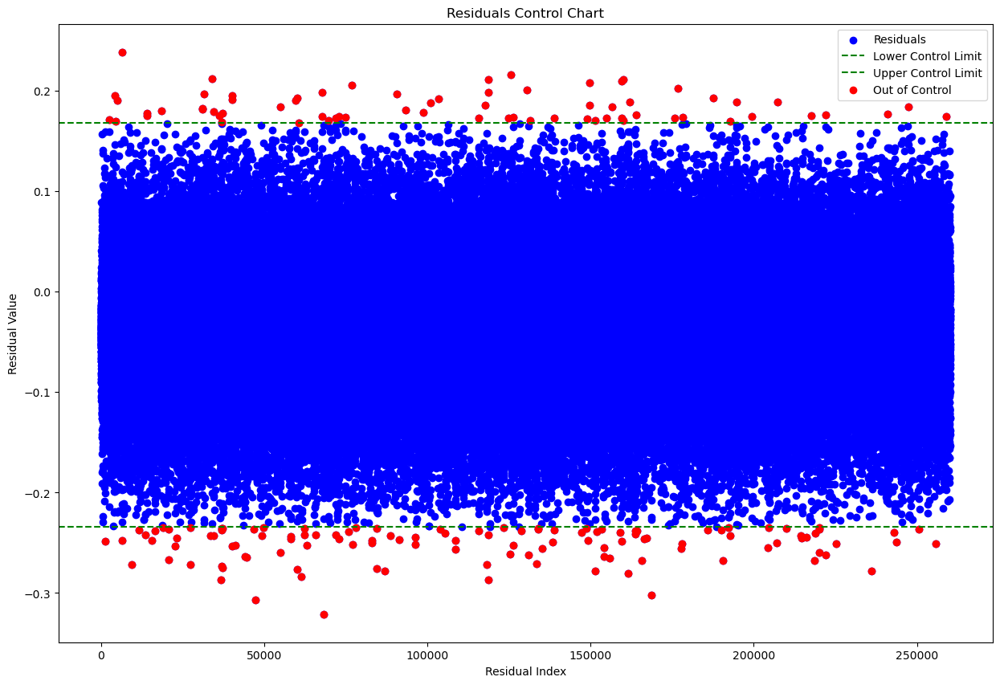

Out of control indices:  (array([  1312,   2466,   4326,   4354,   4840,   6365,   6409,   9435,
        11489,  13621,  14000,  14027,  15556,  16541,  18581,  19101,
        20621,  20646,  22791,  23237,  27344,  27347,  31026,  31104,
        31555,  33501,  34059,  34526,  34585,  36194,  36585,  36991,
        37051,  37063,  37066,  37095,  37099,  37121,  40064,  40085,
        40113,  41151,  44164,  44635,  46694,  47175,  49325,  49679,
        55026,  55030,  58029,  58120,  59636,  60011,  60146,  60522,
        61399,  62190,  62419,  63111,  65674,  67686,  67777,  68196,
        69664,  71894,  71908,  72881,  72882,  74944,  75760,  76937,
        76996,  77948,  82899,  82914,  84507,  84540,  86996,  88739,
        90509,  91276,  93319,  96247,  96374,  98645, 100941, 103506,
       103945, 105404, 108524, 108592, 115589, 115651, 117771, 118192,
       118639, 118701, 118702, 118711, 123231, 124811, 125318, 125456,
       126270, 126329, 128782, 130394, 130856, 1313

In [280]:
lower_limit = mean - 4*std
upper_limit = mean + 4*std

# Create a scatter plot of all pixel values
plt.figure(figsize=(15, 10))
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Residuals')

# Plot control limit lines
plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')

# Highlight out-of-control points in red

out_of_control_limits = np.logical_or(residuals_list < lower_limit, residuals_list > upper_limit)
out_of_control_indices = np.where(out_of_control_limits)
plt.scatter(out_of_control_indices, residuals_list[out_of_control_limits], c='red', label='Out of Control')

# Add labels and legend
plt.title('Residuals Control Chart')
plt.xlabel('Residual Index')
plt.ylabel('Residual Value')
plt.legend()

# Show the plot
plt.show()

print("Out of control indices: ", out_of_control_indices)

In [281]:
ooc_residuals_indexes = []
ooc_image_indexes = []

for i in out_of_control_indices[0]:
    row_index = i // 510
    column_index = i - row_index*510
    ooc_residuals_indexes.append((row_index,column_index))
    ooc_image_indexes.append((row_index+1, column_index +1))

print("Number of ooc points found: ", len(ooc_image_indexes))
print(ooc_image_indexes)

Number of ooc points found:  187
[(3, 293), (5, 427), (9, 247), (9, 275), (10, 251), (13, 246), (13, 290), (19, 256), (23, 270), (27, 362), (28, 231), (28, 258), (31, 257), (33, 222), (37, 222), (38, 232), (41, 222), (41, 247), (45, 352), (46, 288), (54, 315), (54, 318), (61, 427), (61, 505), (62, 446), (66, 352), (67, 400), (68, 357), (68, 416), (71, 495), (72, 376), (73, 272), (73, 332), (73, 344), (73, 347), (73, 376), (73, 380), (73, 402), (79, 285), (79, 306), (79, 334), (81, 352), (87, 305), (88, 266), (92, 285), (93, 256), (97, 366), (98, 210), (108, 457), (108, 461), (114, 400), (114, 491), (117, 477), (118, 342), (118, 477), (119, 343), (121, 200), (122, 481), (123, 200), (124, 382), (129, 395), (133, 367), (133, 458), (134, 367), (137, 305), (141, 495), (141, 509), (143, 462), (143, 463), (147, 485), (149, 281), (151, 438), (151, 497), (153, 429), (163, 280), (163, 295), (166, 358), (166, 391), (171, 297), (174, 510), (178, 240), (179, 497), (183, 500), (189, 368), (189, 495)

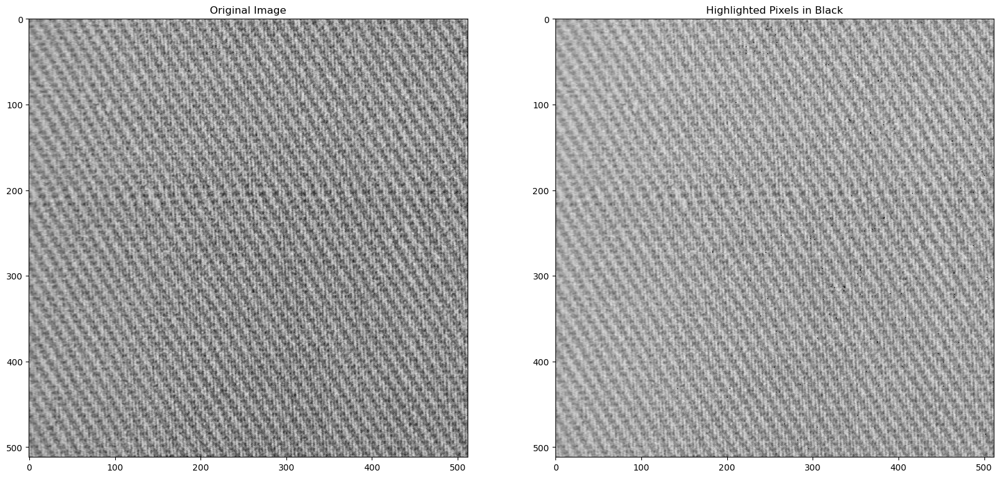

In [282]:
highlighted_img = img.copy()

for i, j in ooc_image_indexes:
    highlighted_img[i, j] = 0  # Set the pixel intensity to maximum (255) for red


# Display the original and highlighted images side by side
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(highlighted_img, cmap='gray')
plt.title('Highlighted Pixels in Black')

plt.show()

## 8.2 2D Autoregressive Model for Predicting Middle Pixel of 5x5 Windows

In [283]:
# Function to extract 5x5 sub-matrices and their corresponding target pixels
# Function to extract 5x5 sub-matrices and their corresponding target pixels
def extract_submatrices_and_targets_5(image_matrix):
    submatrices = []
    targets = []

    for i in range(2, image_matrix.shape[0] - 2):
        for j in range(2, image_matrix.shape[1] - 2):
            submatrix = image_matrix[i-2:i+3, j-2:j+3].flatten()
            target_pixel = image_matrix[i, j]
            submatrices.append(submatrix)
            targets.append(target_pixel)

    return np.vstack(submatrices), np.array(targets)

img = color.rgb2gray(io.imread('0055.jpg'))
image_matrix = np.matrix(img)

submatrices, targets = extract_submatrices_and_targets_5(image_matrix)


submatrices[0]

matrix([[0.61597412, 0.6409251 , 0.66053294, 0.67146431, 0.68127961,
         0.56919804, 0.58602314, 0.59778784, 0.61264078, 0.63870784,
         0.55072902, 0.55857216, 0.56641529, 0.58126824, 0.6191    ,
         0.48406235, 0.49582706, 0.51852314, 0.54989569, 0.59557059,
         0.46837608, 0.49891529, 0.54597412, 0.59557059, 0.64262941]])

In [284]:
submatrices = np.delete(submatrices, 12, axis=-1)   # Delete the 13th element (pixel to be predicted) along the last axis 
submatrices[0]

matrix([[0.61597412, 0.6409251 , 0.66053294, 0.67146431, 0.68127961,
         0.56919804, 0.58602314, 0.59778784, 0.61264078, 0.63870784,
         0.55072902, 0.55857216, 0.58126824, 0.6191    , 0.48406235,
         0.49582706, 0.51852314, 0.54989569, 0.59557059, 0.46837608,
         0.49891529, 0.54597412, 0.59557059, 0.64262941]])

In [285]:
submatrices_flat = submatrices.reshape(submatrices.shape[0], -1)
submatrices_flat[0]

matrix([[0.61597412, 0.6409251 , 0.66053294, 0.67146431, 0.68127961,
         0.56919804, 0.58602314, 0.59778784, 0.61264078, 0.63870784,
         0.55072902, 0.55857216, 0.58126824, 0.6191    , 0.48406235,
         0.49582706, 0.51852314, 0.54989569, 0.59557059, 0.46837608,
         0.49891529, 0.54597412, 0.59557059, 0.64262941]])

In [286]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(np.array(submatrices_flat), np.array(targets), test_size=0.2, random_state=42)

# Create and train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f"Mean Squared Error: {mse}")

# Display the coefficients of the model (weights)
weights = model.coef_
print("Model Coefficients (Weights):")
print(weights)

r_squared = r2_score(y_test, predictions)
print(f"R-squared Value: {r_squared}")

Mean Squared Error: 0.0020899863416162165
Model Coefficients (Weights):
[ 0.03475255 -0.12779003  0.15020861 -0.09944914  0.02753548 -0.03048972
  0.04489972  0.1730398   0.03189437 -0.0394585  -0.14840353  0.45204991
  0.45029165 -0.1492804  -0.0389779   0.03178296  0.17244825  0.04303993
 -0.02831264  0.02833863 -0.10073324  0.14966292 -0.12593245  0.03255491]
R-squared Value: 0.8046073900595165


In [287]:
# Function to reconstruct the image using learned weights
def reconstruct_image_5(image_matrix, learned_weights):
    reconstructed_image = np.zeros_like(image_matrix)

    for i in range(2, image_matrix.shape[0] - 2):
        for j in range(2, image_matrix.shape[1] - 2):
            submatrix = image_matrix[i-2:i+3, j-2:j+3].flatten()
            updated_matrix = np.delete(np.array(submatrix), 12, axis=-1)
            predicted_pixel = np.dot(updated_matrix, learned_weights)
            reconstructed_image[i, j] = predicted_pixel

    return reconstructed_image



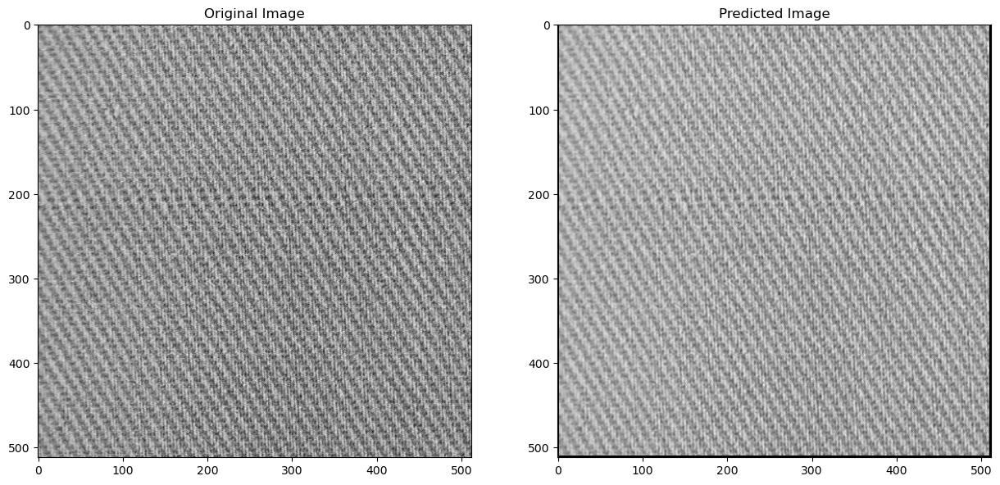

In [288]:
# Reconstruct the image using learned weights
reconstructed_img = reconstruct_image_5(image_matrix, weights)

# Display the original and reconstructed images side by side
plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(image_matrix, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_img, cmap='gray')
plt.title('Predicted Image')

plt.show()

In [289]:
reconstructed_img

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.52129425, ..., 0.61775736, 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.62779891, ..., 0.54133526, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [290]:
# Calculate residuals
residuals = image_matrix - reconstructed_img

residuals

matrix([[0.61597412, 0.6409251 , 0.66053294, ..., 0.62356431, 0.59275725,
         0.58408078],
        [0.56919804, 0.58602314, 0.59778784, ..., 0.65493686, 0.59219176,
         0.56447294],
        [0.55072902, 0.55857216, 0.04512104, ..., 0.03661401, 0.74121137,
         0.71573255],
        ...,
        [0.62078157, 0.71211647, 0.06470972, ..., 0.00664082, 0.46226706,
         0.46535529],
        [0.56419804, 0.63870784, 0.67906235, ..., 0.63032902, 0.51241412,
         0.57123765],
        [0.54851176, 0.56419804, 0.58886627, ..., 0.73426196, 0.59476706,
         0.57629804]])

In [291]:
trimmed_residuals = residuals[2:-2, 2:-2]
trimmed_residuals.shape[0]

508

In [292]:
residuals_list = np.array(trimmed_residuals.ravel())[0]

residuals_list

array([0.04512104, 0.03942663, 0.04216347, ..., 0.05214707, 0.05949037,
       0.00664082])

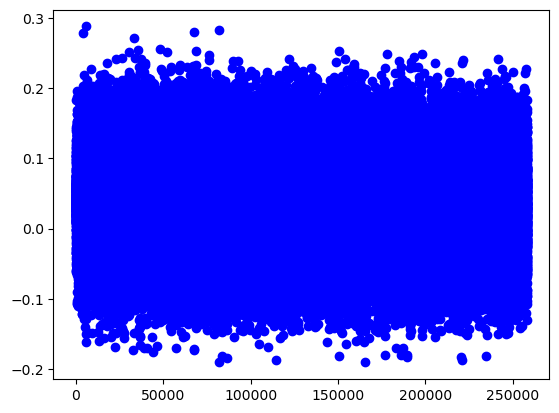

In [293]:
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Pixel Values')

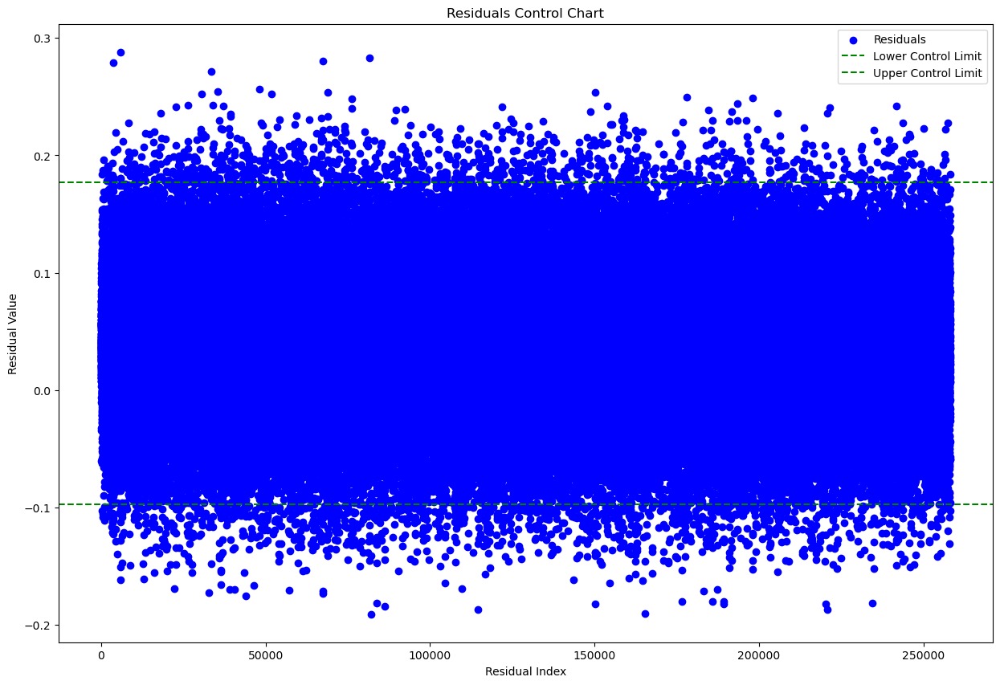

In [294]:
mean = residuals_list.mean()
std = residuals_list.std()

lower_limit = mean - 3*std
upper_limit = mean + 3*std

# Create a scatter plot of all pixel values
plt.figure(figsize=(15, 10))
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Residuals')

# Plot control limit lines
plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')

# Highlight out-of-control points in red
'''out_of_control_indices = np.where(out_of_control_limits)
plt.scatter(out_of_control_indices, pixel_values.ravel()[out_of_control_limits], c='red', label='Out of Control')'''

# Add labels and legend
plt.title('Residuals Control Chart')
plt.xlabel('Residual Index')
plt.ylabel('Residual Value')
plt.legend()

# Show the plot
plt.show()


Again, try 4-sigma limits.

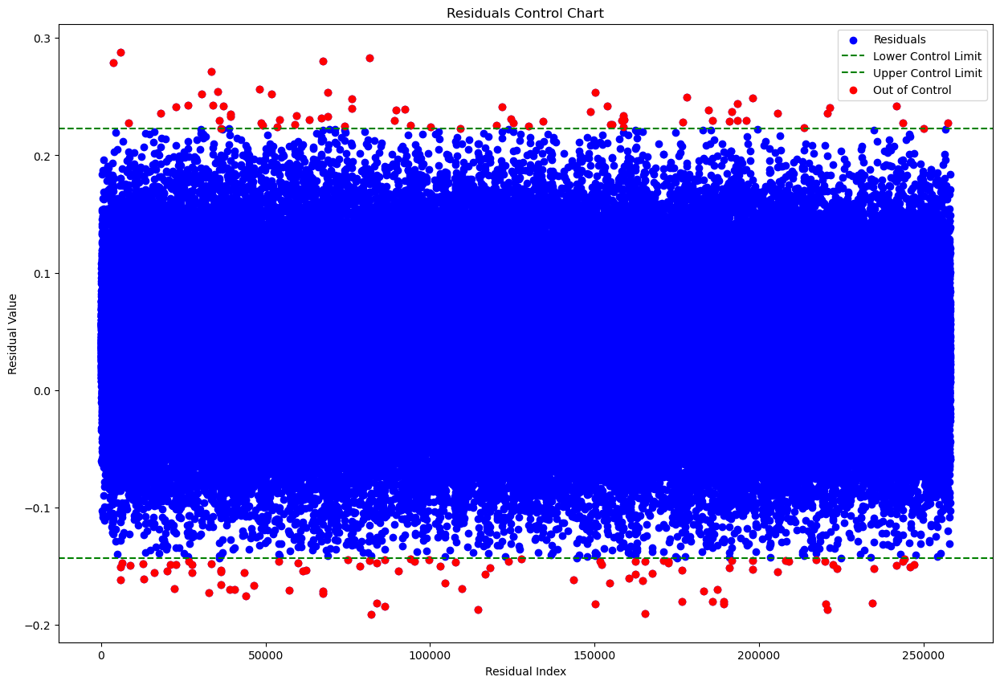

Out of control indices:  (array([  3801,   5832,   5833,   5876,   6403,   8374,   8890,  12632,
        13060,  16036,  18000,  20057,  21144,  22194,  22638,  22855,
        26376,  26732,  27672,  27687,  30475,  32862,  33418,  33419,
        33942,  35545,  36029,  36338,  36410,  36413,  36468,  37038,
        38996,  39420,  39448,  40525,  43483,  43952,  46482,  48222,
        48678,  49078,  51800,  53594,  54104,  54307,  57294,  58895,
        59268,  59801,  61439,  62356,  63272,  66913,  67350,  67351,
        67421,  68883,  68898,  74140,  74955,  76128,  76171,  78702,
        81669,  81670,  82081,  83668,  83792,  86147,  86180,  89129,
        89646,  90411,  92446,  93964,  93965,  95362,  99550, 100038,
       103030, 104468, 107659, 109136, 109634, 114628, 116785, 118174,
       120236, 121831, 123810, 124457, 125326, 127761, 129954, 134397,
       143676, 148689, 150322, 150323, 151733, 152245, 153822, 154657,
       154837, 155440, 158322, 158819, 158831, 1589

In [295]:
lower_limit = mean - 4*std
upper_limit = mean + 4*std

# Create a scatter plot of all pixel values
plt.figure(figsize=(15, 10))
plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Residuals')

# Plot control limit lines
plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')

# Highlight out-of-control points in red

out_of_control_limits = np.logical_or(residuals_list < lower_limit, residuals_list > upper_limit)
out_of_control_indices = np.where(out_of_control_limits)
plt.scatter(out_of_control_indices, residuals_list[out_of_control_limits], c='red', label='Out of Control')

# Add labels and legend
plt.title('Residuals Control Chart')
plt.xlabel('Residual Index')
plt.ylabel('Residual Value')
plt.legend()

# Show the plot
plt.show()

print("Out of control indices: ", out_of_control_indices)

In [296]:
ooc_residuals_indexes = []
ooc_image_indexes = []

for i in out_of_control_indices[0]:
    row_index = i // 508
    column_index = i - row_index*508
    ooc_residuals_indexes.append((row_index,column_index))
    ooc_image_indexes.append((row_index+2, column_index +2))

print("Number of ooc points found: ", len(ooc_image_indexes))
print(ooc_image_indexes)

Number of ooc points found:  165
[(9, 247), (13, 246), (13, 247), (13, 290), (14, 309), (18, 248), (19, 256), (26, 442), (27, 362), (33, 290), (37, 222), (41, 247), (43, 318), (45, 352), (46, 288), (46, 505), (53, 470), (54, 318), (56, 242), (56, 257), (61, 505), (66, 352), (67, 400), (67, 401), (68, 416), (71, 495), (72, 471), (73, 272), (73, 344), (73, 347), (73, 402), (74, 464), (78, 390), (79, 306), (79, 334), (81, 395), (87, 305), (88, 266), (93, 256), (96, 472), (97, 420), (98, 312), (103, 494), (107, 256), (108, 258), (108, 461), (114, 400), (117, 477), (118, 342), (119, 367), (122, 481), (124, 382), (126, 282), (133, 367), (134, 296), (134, 297), (134, 367), (137, 305), (137, 320), (147, 482), (149, 281), (151, 438), (151, 481), (156, 472), (162, 391), (162, 392), (163, 295), (166, 358), (166, 482), (171, 297), (171, 330), (177, 231), (178, 240), (179, 497), (183, 500), (186, 494), (186, 495), (189, 368), (197, 492), (198, 472), (204, 416), (207, 330), (213, 473), (216, 426), (

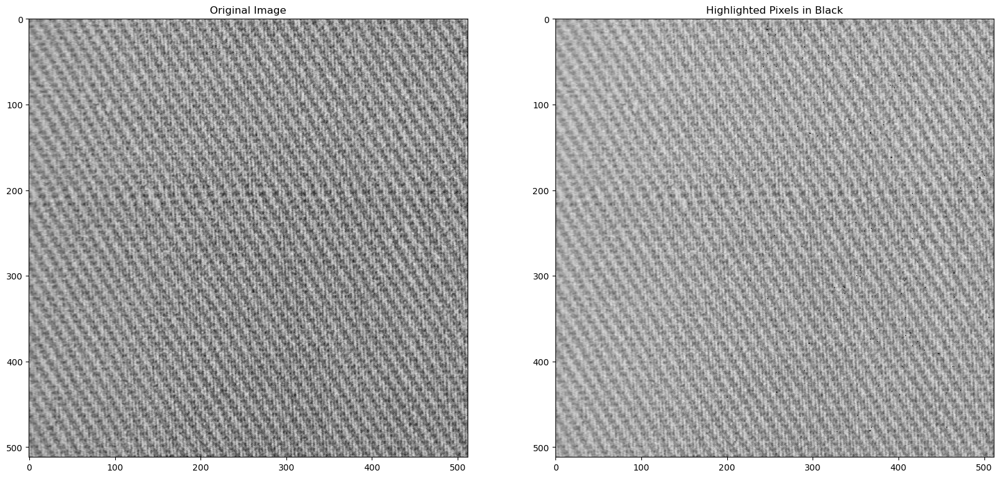

In [297]:
highlighted_img = img.copy()

for i, j in ooc_image_indexes:
    highlighted_img[i, j] = 0  # Set the pixel intensity to maximum (255) for red


# Display the original and highlighted images side by side
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(highlighted_img, cmap='gray')
plt.title('Highlighted Pixels in Black')

plt.show()

The first model which uses 3x3 windows has r-squared value of 0.762 and found 189 defective pixels. The second model which uses 5x5 windows has r-squared value of 0.805 and found 165 defective pixels. By comparison, increasing the window size yielded a better-fit model for middle pixel predicting. We would also increase the window size more, but that would also increase the computational complexity. Therefore, we propose using the second model to find defective pixels in a linen texture.

In [298]:
def find_defectives(image):

    image_matrix = np.matrix(image)

    submatrices, targets = extract_submatrices_and_targets_5(image_matrix)

    submatrices = np.delete(submatrices, 12, axis=-1) 

    submatrices_flat = submatrices.reshape(submatrices.shape[0], -1)

    X_train, X_test, y_train, y_test = train_test_split(np.array(submatrices_flat), np.array(targets), test_size=0.2, random_state=42)

    # Create and train a linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions on the test set
    predictions = model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, predictions)
    print(f"Mean Squared Error: {mse}")

    # Display the coefficients of the model (weights)
    weights = model.coef_
    print("Model Coefficients (Weights):")
    print(weights)

    r_squared = r2_score(y_test, predictions)
    print(f"R-squared Value: {r_squared}")

    reconstructed_img = reconstruct_image_5(image_matrix, weights)

    residuals = image_matrix - reconstructed_img

    trimmed_residuals = residuals[2:-2, 2:-2]

    residuals_list = np.array(trimmed_residuals.ravel())[0]

    mean = residuals_list.mean()
    std = residuals_list.std()

    lower_limit = mean - 4*std
    upper_limit = mean + 4*std

    # Create a scatter plot of all pixel values
    plt.figure(figsize=(15, 10))
    plt.scatter(np.arange(len(residuals_list)), residuals_list, c='blue', label='Residuals')

    # Plot control limit lines
    plt.axhline(y=lower_limit, color='green', linestyle='--', label='Lower Control Limit')
    plt.axhline(y=upper_limit, color='green', linestyle='--', label='Upper Control Limit')
    
    out_of_control_limits = np.logical_or(residuals_list < lower_limit, residuals_list > upper_limit)
    out_of_control_indices = np.where(out_of_control_limits)
    plt.scatter(out_of_control_indices, residuals_list[out_of_control_limits], c='red', label='Out of Control')

    
    # Add labels and legend
    plt.title('Residuals Control Chart')
    plt.xlabel('Residual Index')
    plt.ylabel('Residual Value')
    plt.legend()

    # Show the plot
    plt.show()


    ooc_residuals_indexes = []
    ooc_image_indexes = []

    for i in out_of_control_indices[0]:
        row_index = i // 508
        column_index = i - row_index*508
        ooc_residuals_indexes.append((row_index,column_index))
        ooc_image_indexes.append((row_index+2, column_index +2))

    print("Number of defects found: ", len(ooc_image_indexes))

    
    highlighted_img = image.copy()

    for i, j in ooc_image_indexes:
        highlighted_img[i, j] = 0  # Set the pixel intensity to maximum (255) for red


    # Display the original and highlighted images side by side
    plt.figure(figsize=(20, 15))

    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(highlighted_img, cmap='gray')
    plt.title('Highlighted Pixels in Black')

    plt.show()
    

    return ("Defect detection is completed")

In [299]:
# Generate 100 random integers between 2 and 196
random_integers = np.random.randint(2, 197, 100)

# Print or use the generated random integers
print(random_integers)

[162  23  30   9  89   9 142  71 159 167  55 112 177 129  15  99  90  26
 154  57 165  15  24 171 147 180  25 136 178 162 106 153 196 133  44 196
 188 150   2  85 184 141  27  45 121  17 184 127 114  86 158  11 133 113
 109  53 110  94  88 106 146 160  53 154 181  29  45  97  24  80 145  29
  77  52  93  28  46  55 142 174 189 193  34 100  38  81 121 141  60  96
  30  15 108  33   4 147 192   2  36 133]


Images 48, 65, 30, 16, and 98 were selected in the first run for comparison. We unfortunately lost this previous array since we did not use seed. 

Mean Squared Error: 0.003872236643567309
Model Coefficients (Weights):
[-0.0983986   0.12318399 -0.15080153  0.14430734 -0.10055674  0.15210605
 -0.16261107  0.31876616 -0.13687784  0.13112671 -0.1638185   0.43492608
  0.4341997  -0.16319555  0.13132038 -0.1370176   0.31659678 -0.16041574
  0.15175795 -0.10056348  0.14331528 -0.15042294  0.12397854 -0.09715077]
R-squared Value: 0.6336953515017121


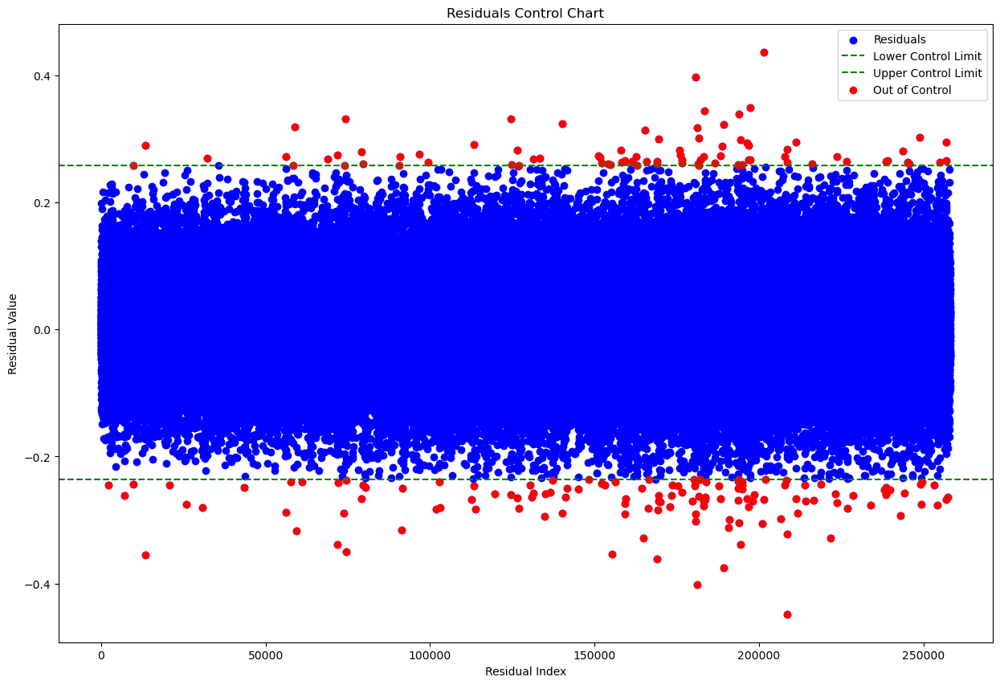

Number of defects found:  214


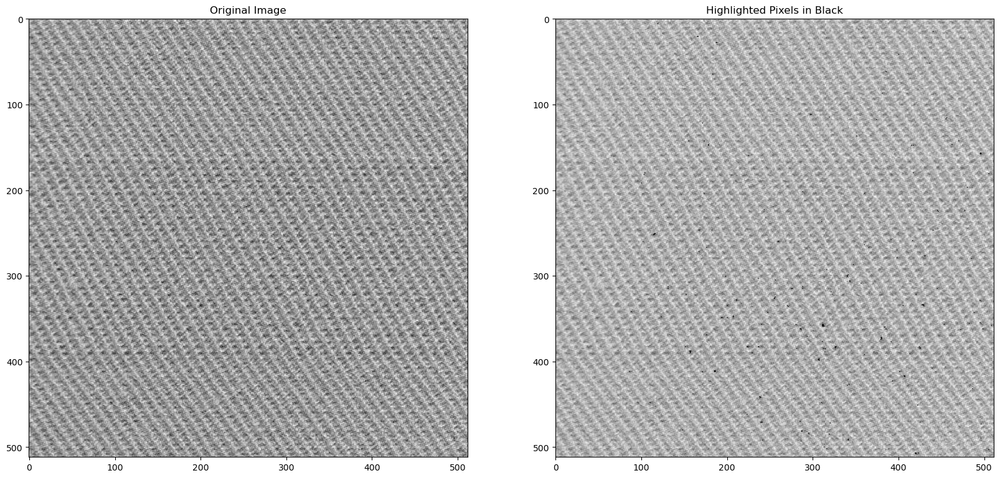

'Defect detection is completed'

In [300]:
img_48 = color.rgb2gray(io.imread('0048.jpg'))
find_defectives(img_48)

Mean Squared Error: 0.0012420194147753853
Model Coefficients (Weights):
[ 0.05572103 -0.07006069 -0.00608641 -0.06449506  0.05366722 -0.04564789
 -0.0861332   0.38134784 -0.07308661 -0.05434627 -0.05315802  0.46024604
  0.46064398 -0.05325622 -0.05334726 -0.07383782  0.38418143 -0.08866159
 -0.04377996  0.05369495 -0.06548139 -0.00628925 -0.06997257  0.05531307]
R-squared Value: 0.9652277510285509


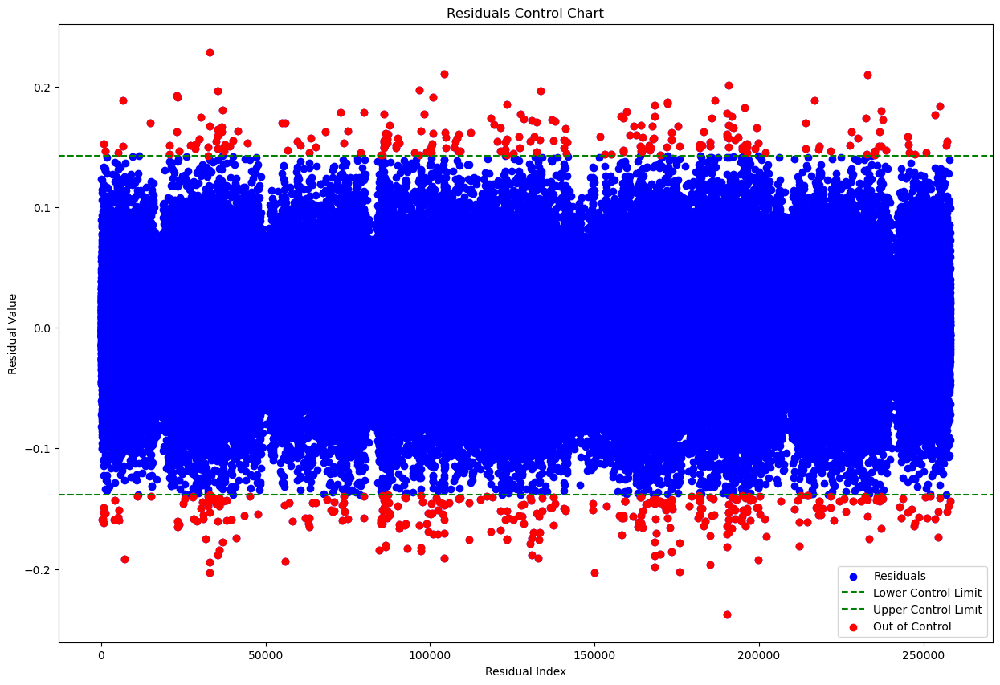

Number of defects found:  538


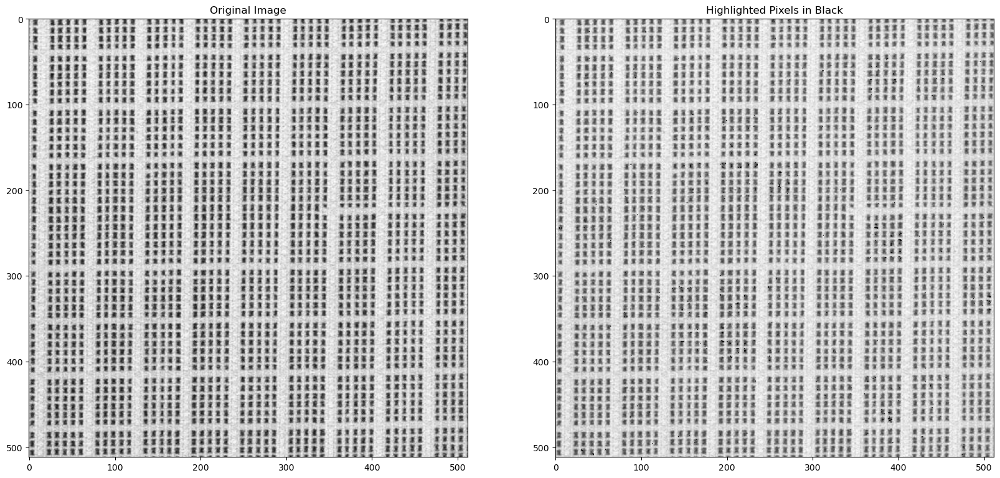

'Defect detection is completed'

In [301]:
img_65 = color.rgb2gray(io.imread('0065.jpg'))
find_defectives(img_65)

Mean Squared Error: 0.009450971354657849
Model Coefficients (Weights):
[ 3.34984445e-02 -7.86579489e-02  6.02515363e-04 -6.27759610e-02
  3.22643072e-02 -1.15768270e-01  3.07517739e-01 -1.85472269e-01
  3.01067214e-01 -1.04049665e-01 -5.98476694e-02  4.05379438e-01
  4.03564954e-01 -5.85185361e-02 -1.03585130e-01  3.04293235e-01
 -1.90773505e-01  3.07268374e-01 -1.13469555e-01  3.21513830e-02
 -6.20294676e-02  1.69576581e-04 -7.52374694e-02  2.94660723e-02]
R-squared Value: 0.78996722369262


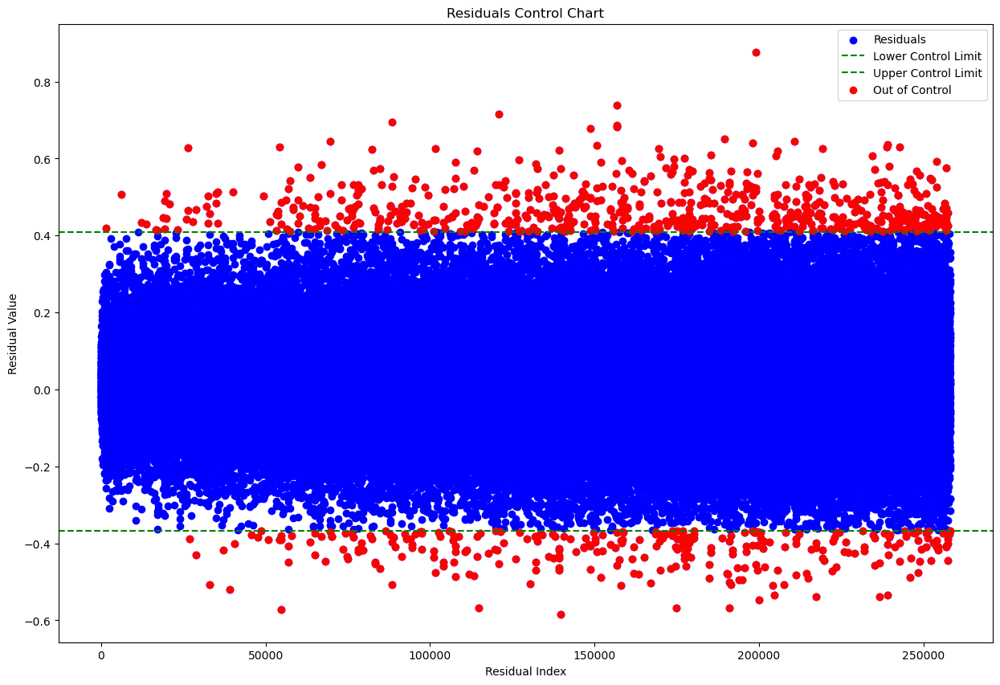

Number of defects found:  959


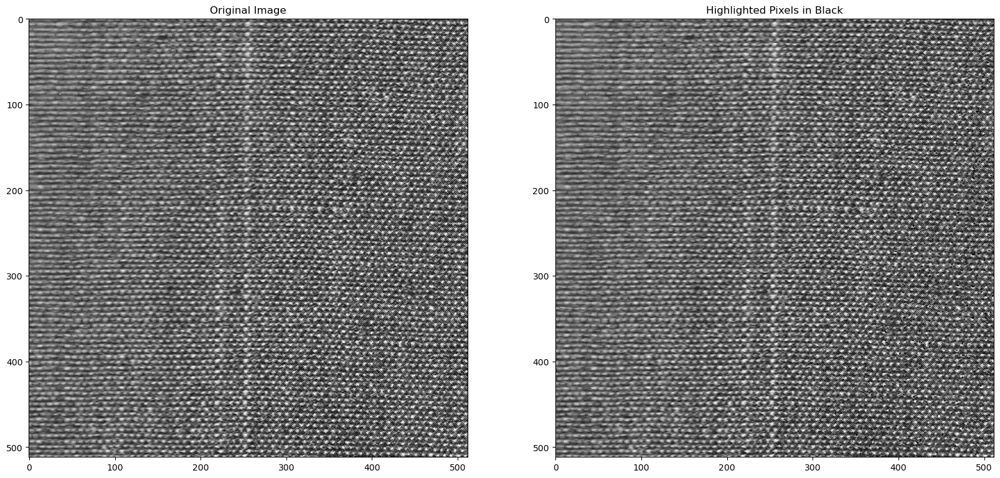

'Defect detection is completed'

In [302]:
img_30 = color.rgb2gray(io.imread('0030.jpg'))
find_defectives(img_30)

Mean Squared Error: 0.0015843669365600112
Model Coefficients (Weights):
[-0.02644338  0.07460812 -0.15513281  0.06936713 -0.02290695  0.07088607
 -0.27123769  0.5156254  -0.31173294  0.11184422 -0.20066559  0.5987677
  0.59734096 -0.19937924  0.1143615  -0.31365034  0.51522933 -0.26943865
  0.06912535 -0.02368828  0.07027977 -0.15446954  0.07466655 -0.02627622]
R-squared Value: 0.8481857264816126


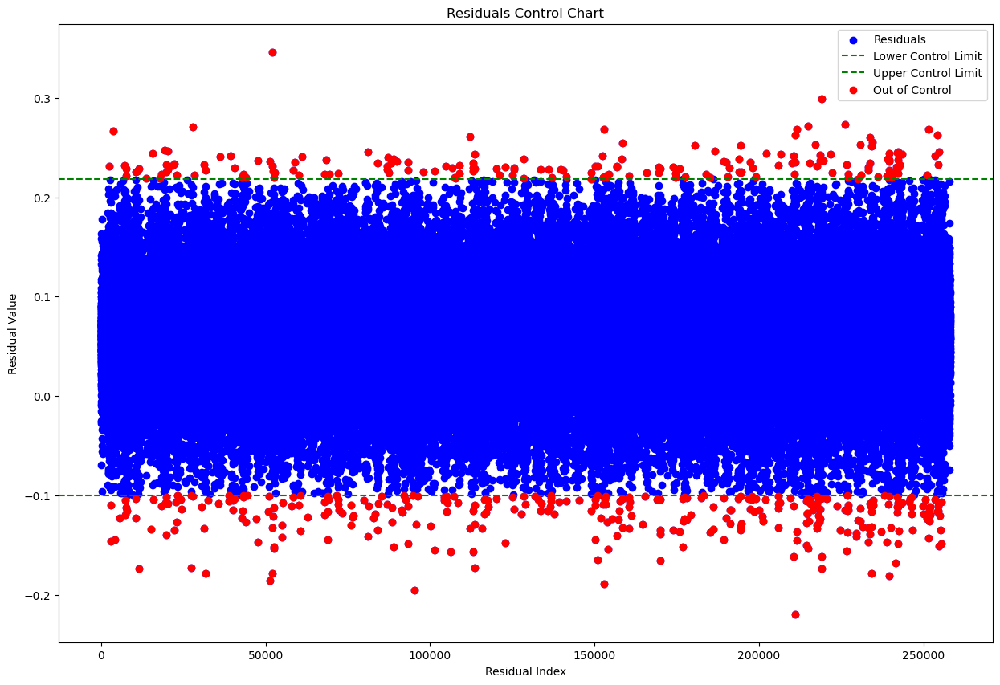

Number of defects found:  497


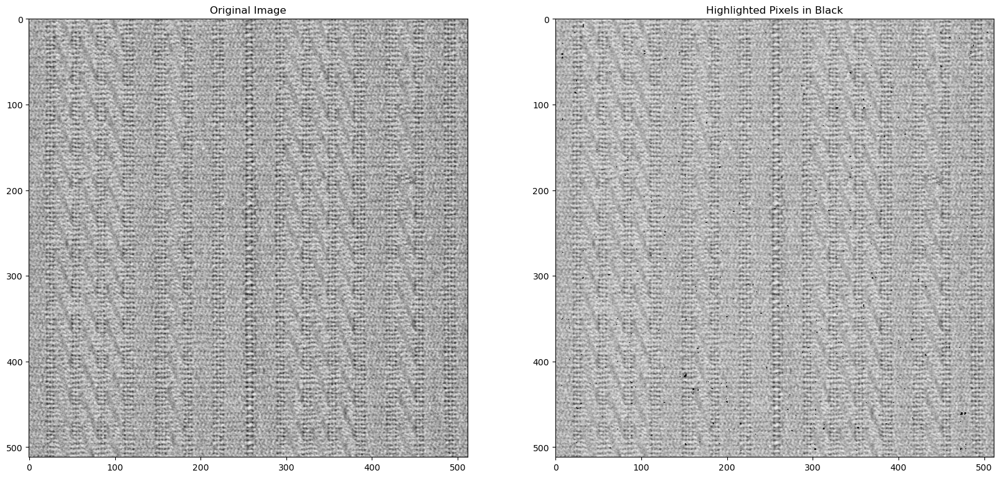

'Defect detection is completed'

In [303]:
img_16 = color.rgb2gray(io.imread('0016.jpg'))
find_defectives(img_16)

Mean Squared Error: 0.002194309144639915
Model Coefficients (Weights):
[ 0.08565894 -0.16622709  0.12199971 -0.16761981  0.08337756 -0.11678156
  0.11173253  0.14918598  0.11827543 -0.11432132 -0.00675213  0.39697696
  0.39619643 -0.00571352 -0.11497873  0.11806164  0.14990576  0.10985599
 -0.11528637  0.08484353 -0.16846034  0.1220743  -0.16509733  0.08416777]
R-squared Value: 0.8945254719651429


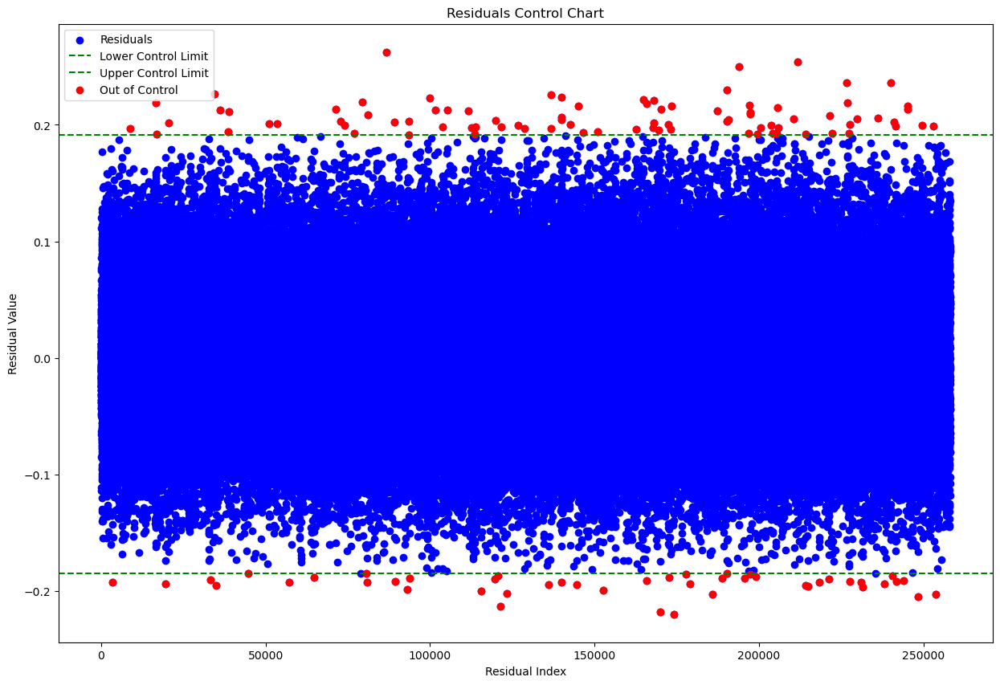

Number of defects found:  132


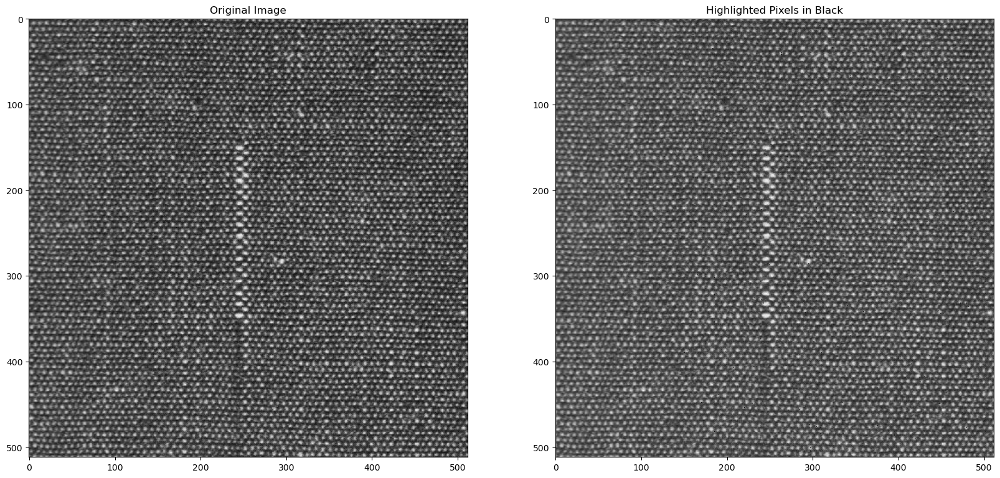

'Defect detection is completed'

In [304]:
img_98 = color.rgb2gray(io.imread('0098.jpg'))
find_defectives(img_98)